In [1]:
%env SPECTRAL_CONNECTIVITY_ENABLE_GPU=true

env: SPECTRAL_CONNECTIVITY_ENABLE_GPU=true


In [2]:
import os


os.chdir('/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys')
import cupy as xp
from cupyx.scipy.fft import ifft
from cupyx.scipy.sparse.linalg import svds
from spectral_connectivity import Multitaper, Connectivity
import importlib
import pandas as pd
from itertools import combinations
import os
from bidict import bidict
import lfp.lfp_analysis.LFP_collection as LFP_collection
import pickle 
def pickle_this(thing_to_pickle, file_name):
    """
    Pickles things
    Args (2):
        thing_to_pickle: anything you want to pickle
        file_name: str, filename that ends with .pkl
    Returns:
        none
    """
    with open(file_name, "wb") as file:
        pickle.dump(thing_to_pickle, file)
def unpickle_this(pickle_file):
    """
    Unpickles things
    Args (1):
        file_name: str, pickle filename that already exists and ends with .pkl
    Returns:
        pickled item
    """
    with open(pickle_file, "rb") as file:
        return pickle.load(file)

df = pd.read_excel(r"lfp/channel_mapping_sme.xlsx")
spike_cols = [col for col in df.columns if 'spike_interface_' in col.lower()]

# Extract brain regions from column names
# Assumes format 'spike_interface_REGION'
brain_regions = [col.split('spike_interface_')[1] for col in spike_cols]

# Create nested dictionary
subject_to_channel_dict = {}







for _, row in df.iterrows():
    subject = row['Subject'].astype(str)
    # Initialize inner dictionary for this subject
    subject_to_channel_dict[subject] = {}
    
    # Populate inner dictionary with brain region: spike value pairs
    for col, region in zip(spike_cols, brain_regions):
        subject_to_channel_dict[subject][region] = int(row[col])
behavior_dicts = {}
#pickle_this(subject_to_channel_dict[

def make_recording_to_subj_dict(data_path):
    recording_to_subject = {}
    for root, dirs, files in os.walk(data_path):
        for file in files:
            if file.endswith('merged.rec'):
                subject = str((file.split("_")[-2]).replace('-', '.'))
                recording_to_subject[file] = subject
                behavior_dicts[file] = {}
    return recording_to_subject

# def process(data_path):
#     recording_to_subject = make_recording_to_subj_dict(data_path)
#     print(recording_to_subject)
#     collection = LFP_collection.LFPCollection(subject_to_channel_dict, data_path, recording_to_subject, 4)
#     #collection.process()
#     return collection    
    




/blue/npadillacoreano/mcum/conda/envs/lfp_env/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
os.chdir('/blue/npadillacoreano/')

In [4]:
data_path = r"share/eli_coop_grant"
recording_to_subject = make_recording_to_subj_dict(data_path)
subject_to_channel_dict = {}
for subject in recording_to_subject.values():
    if subject == '6.1':
        mpfc = 14
    if subject == '6.3':
        mpfc = 17
    if subject == '2.1':
        mpfc = 18
    if subject == '2.4': #ramping here
        mpfc = 1 
    if subject == '1.3':
        mpfc = 3
    if subject == '1.2': #minimal ramping in channels 2+ 3
        mpfc = 16
    if subject == '4.2':
        mpfc = 18
    if subject == '4.3':
        mpfc = 19
    if subject == '4.4':
        mpfc = 14
    if subject == '4.1':
        mpfc = 9
    subject_to_channel_dict[subject] = {'mPFC': mpfc, 'IC': 27, 'NAc': 28, 'MD': 29, 'LH': 30, 'BLA': 31}


In [5]:
collection = LFP_collection.LFPCollection(subject_to_channel_dict, data_path, recording_to_subject, 5)


Processing 20250517_121746_Stage8_D8_6-1_merged.rec
Found first timestamp
Processing 20250517_121746_Stage8_D8_6-3_merged.rec
Found first timestamp
Processing 20250517_105306_Stage4_D8_2-1_merged.rec
Found first timestamp
Processing 20250517_105306_Stage4_D8_2-4_merged.rec
Found first timestamp
Processing 20250517_105306_Stage4_D8_1-3_merged.rec
Found first timestamp
Processing 20250517_105306_Stage4_D8_1-2_merged.rec
Found first timestamp
Processing 20250517_134054_Stage4_D8_4-2_merged.rec
Found first timestamp
Processing 20250517_134054_Stage4_D8_4-3_merged.rec
Found first timestamp
Processing 20250517_134054_Stage4_D8_4-4_merged.rec
Found first timestamp
Processing 20250517_134054_Stage4_D8_4-1_merged.rec
Found first timestamp
Processing 20250520_111417_alone_D1_4-2_merged.rec
Found first timestamp
Processing 20250520_111417_alone_D1_4-1_merged.rec
Found first timestamp
Processing 20250520_111417_alone_D1_4-3_merged.rec
Found first timestamp


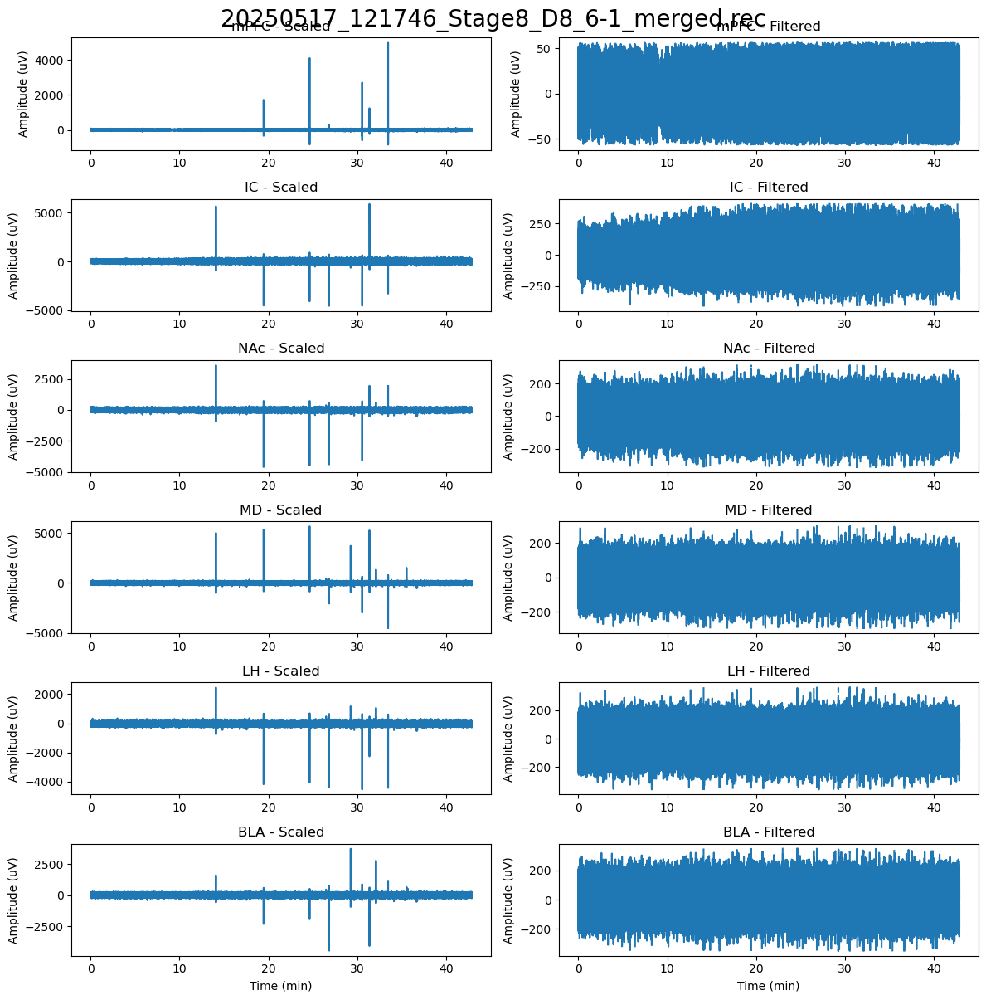

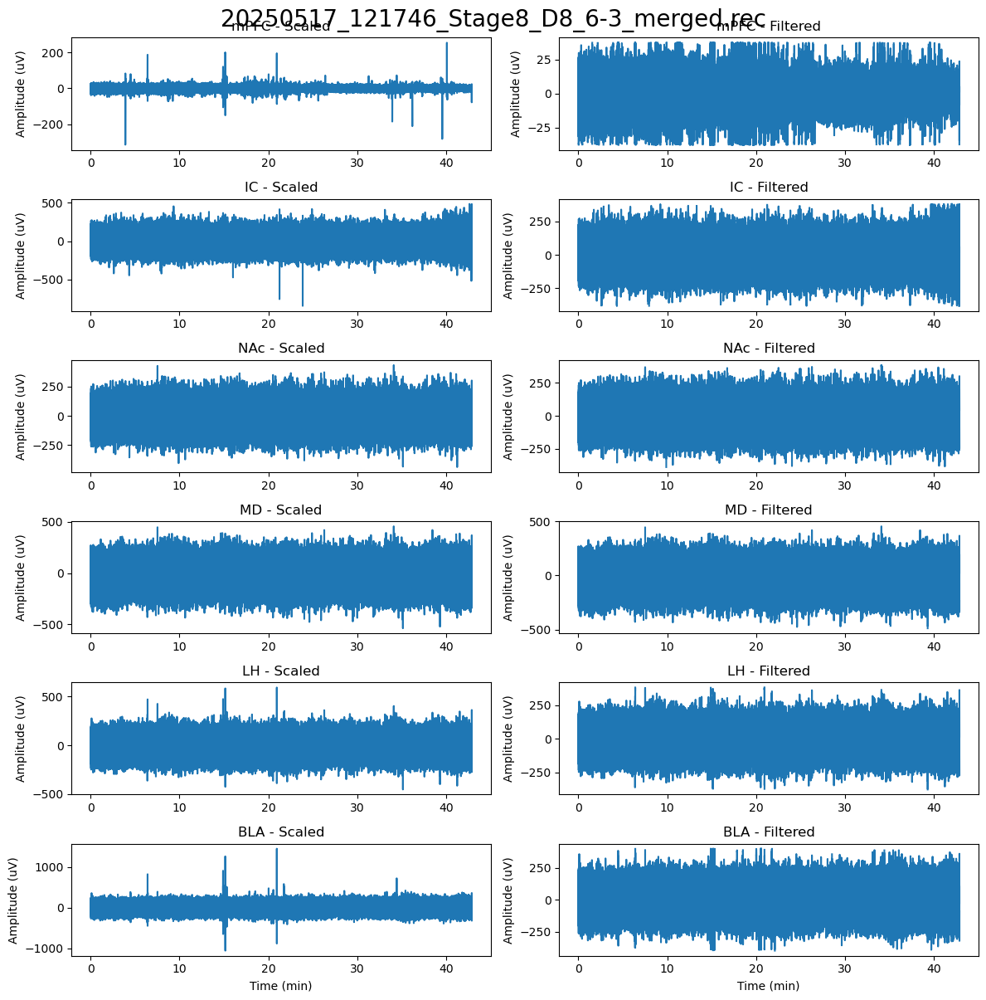

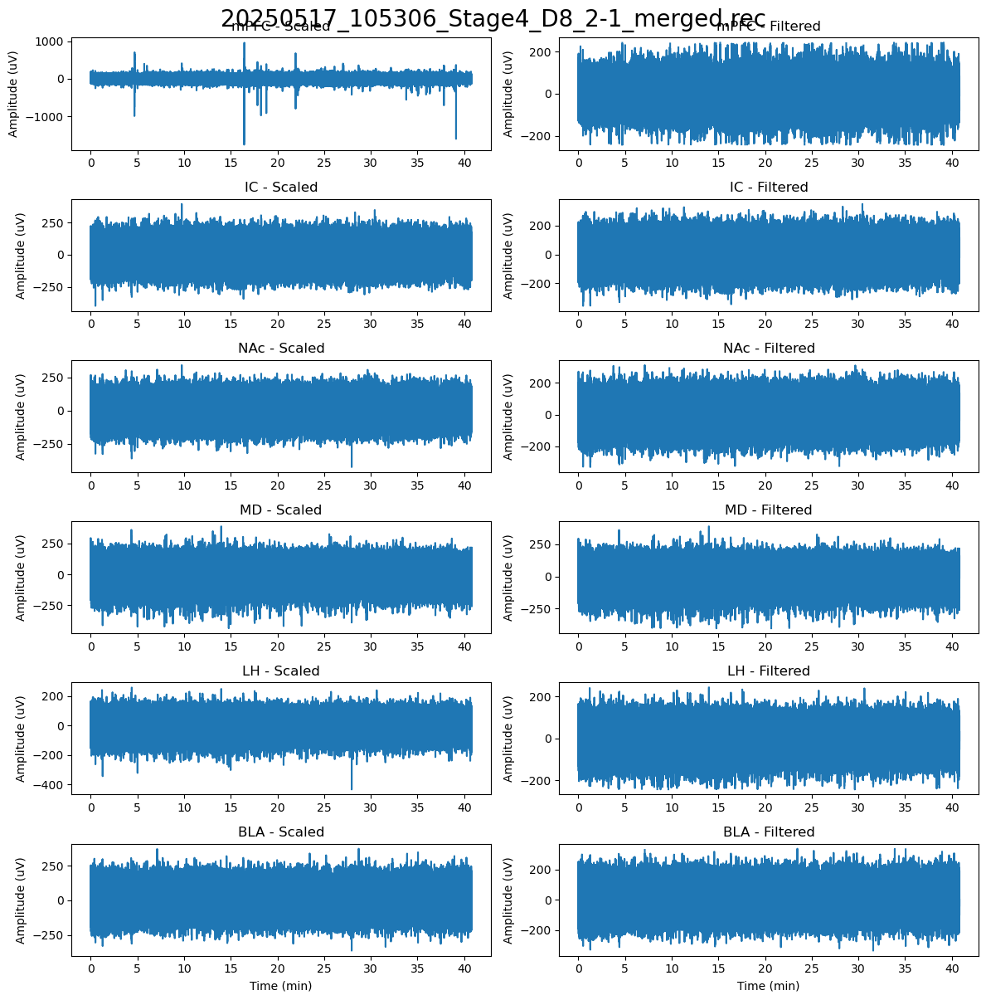

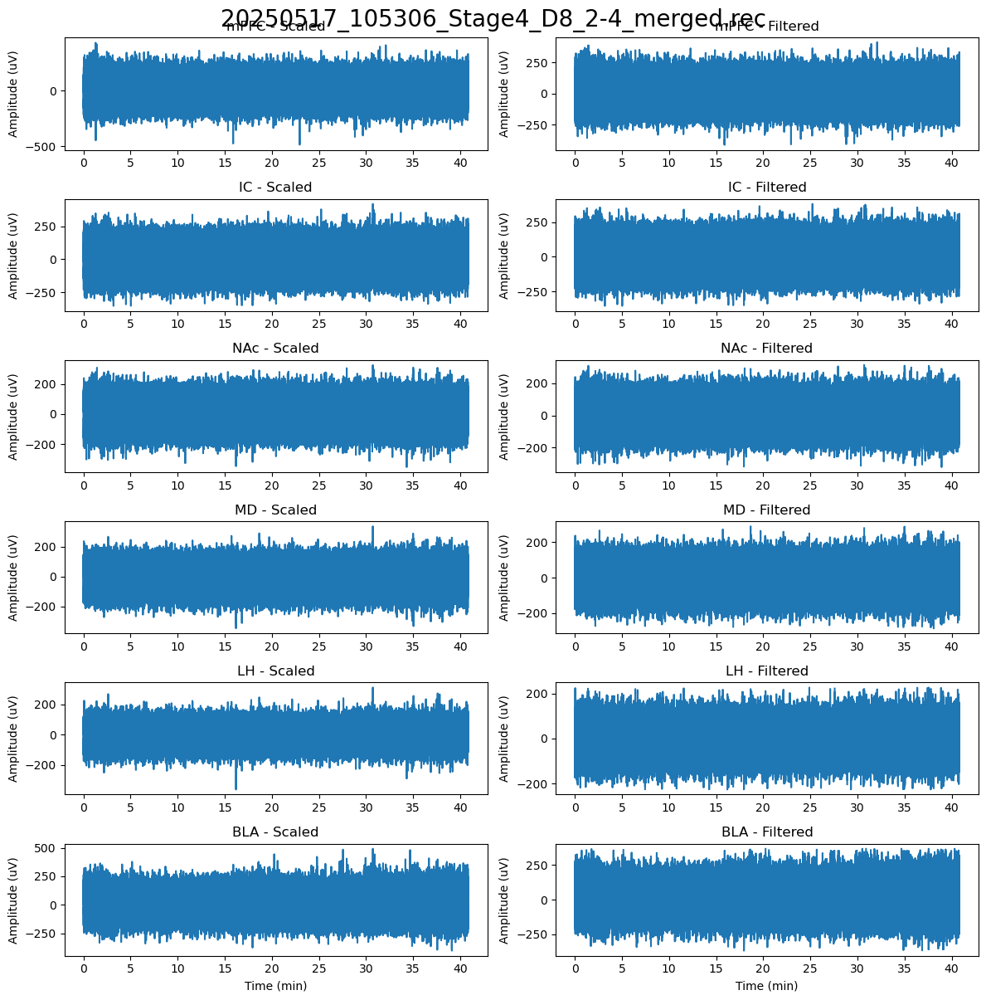

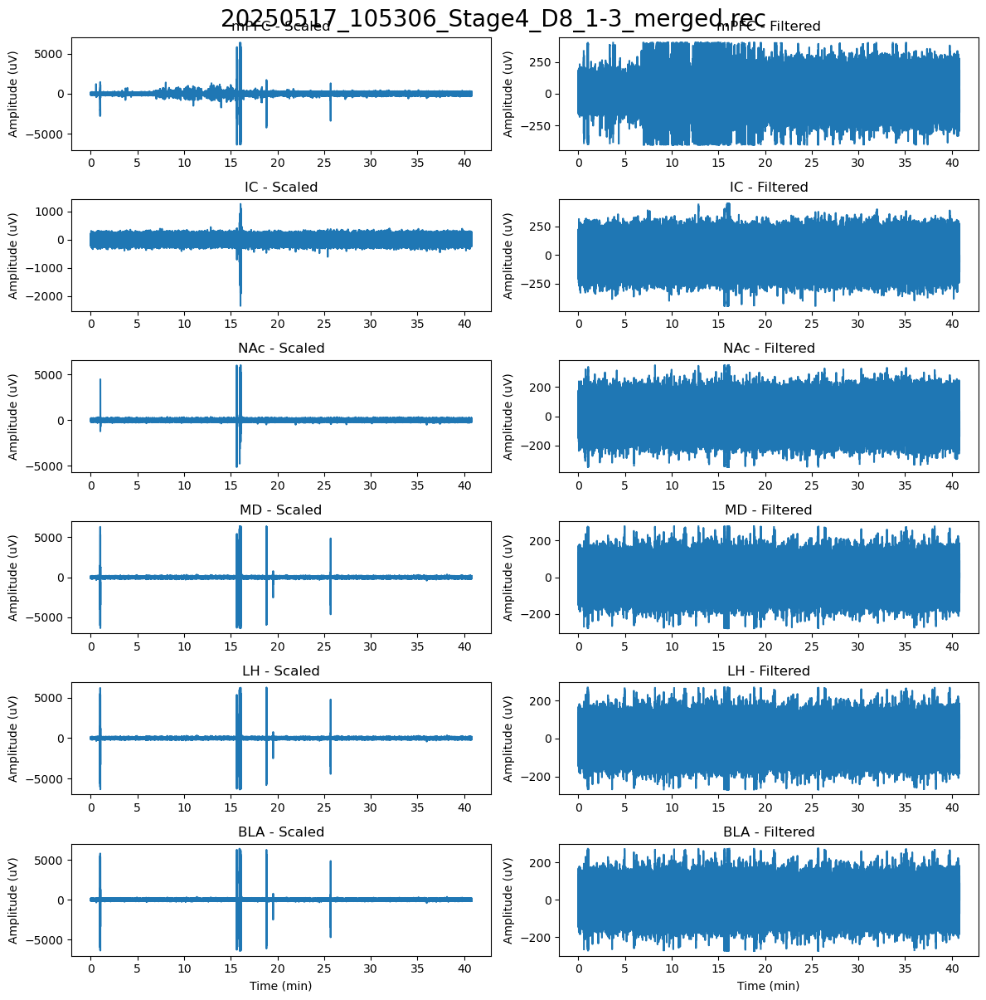

...

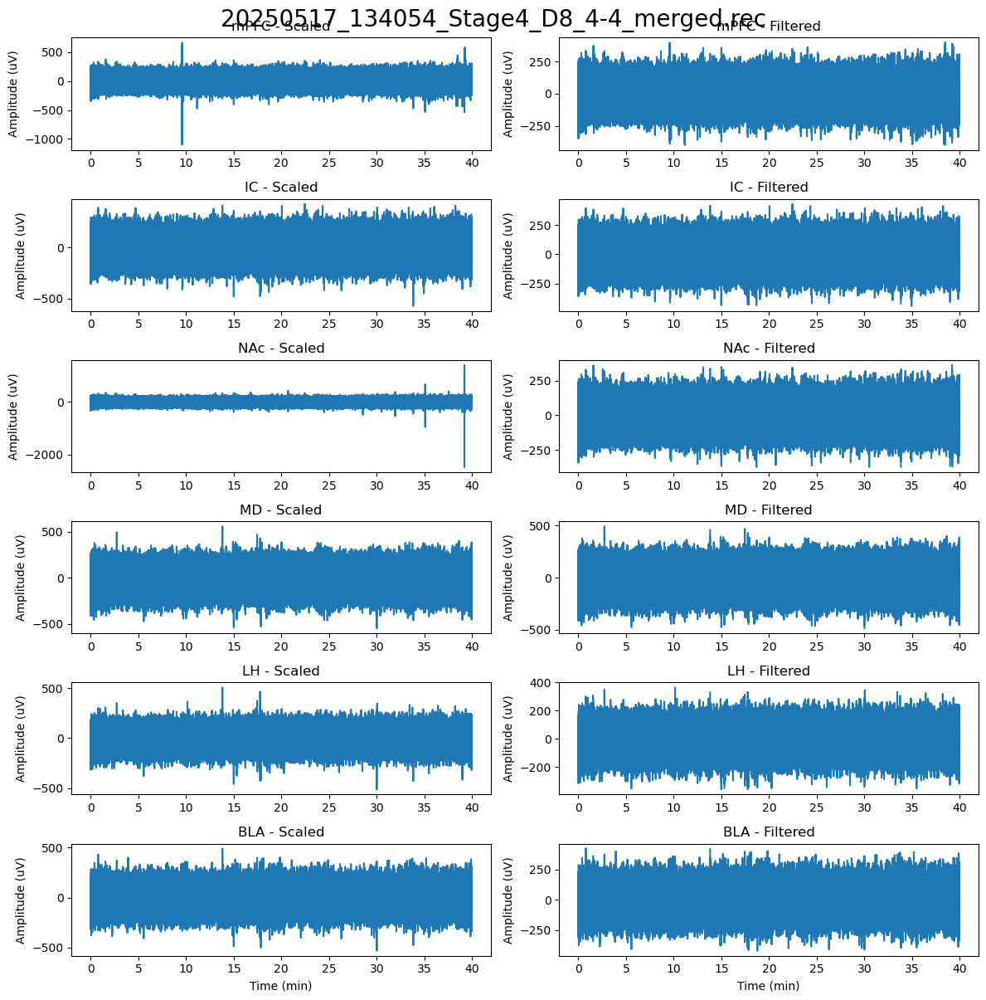

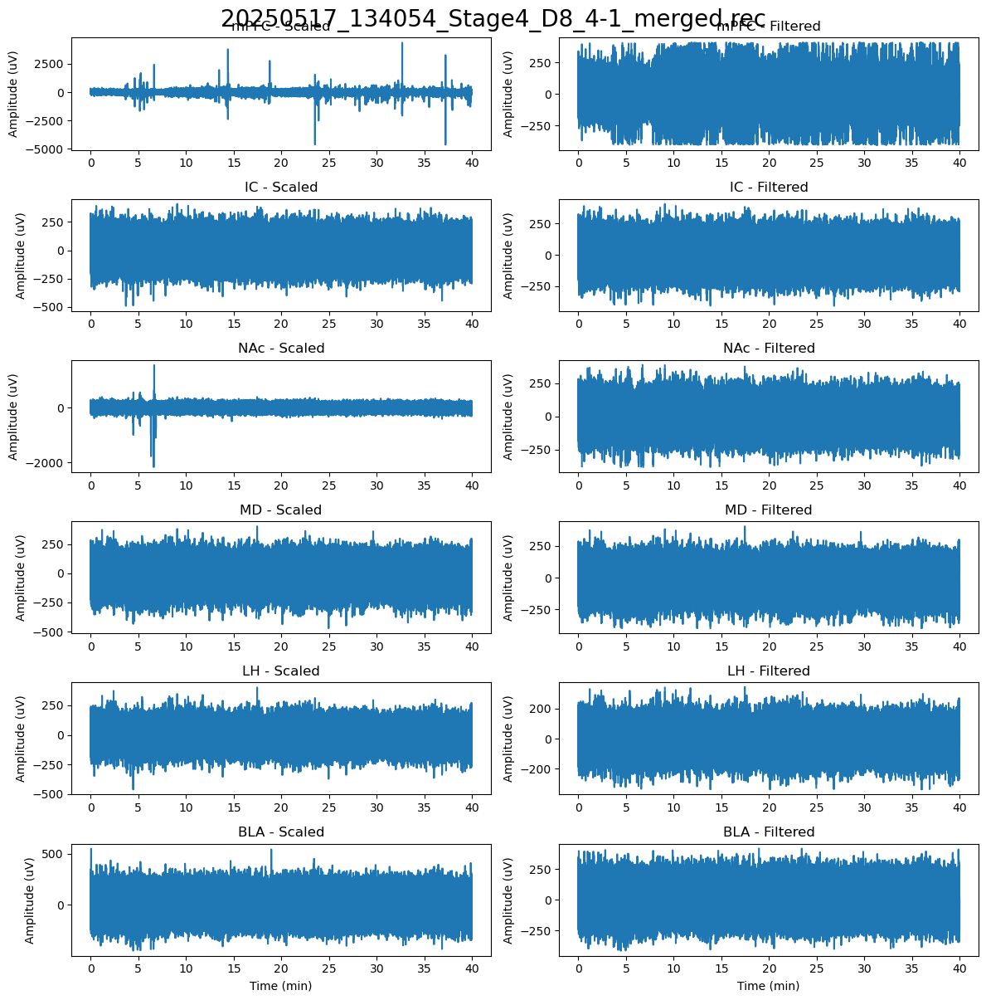

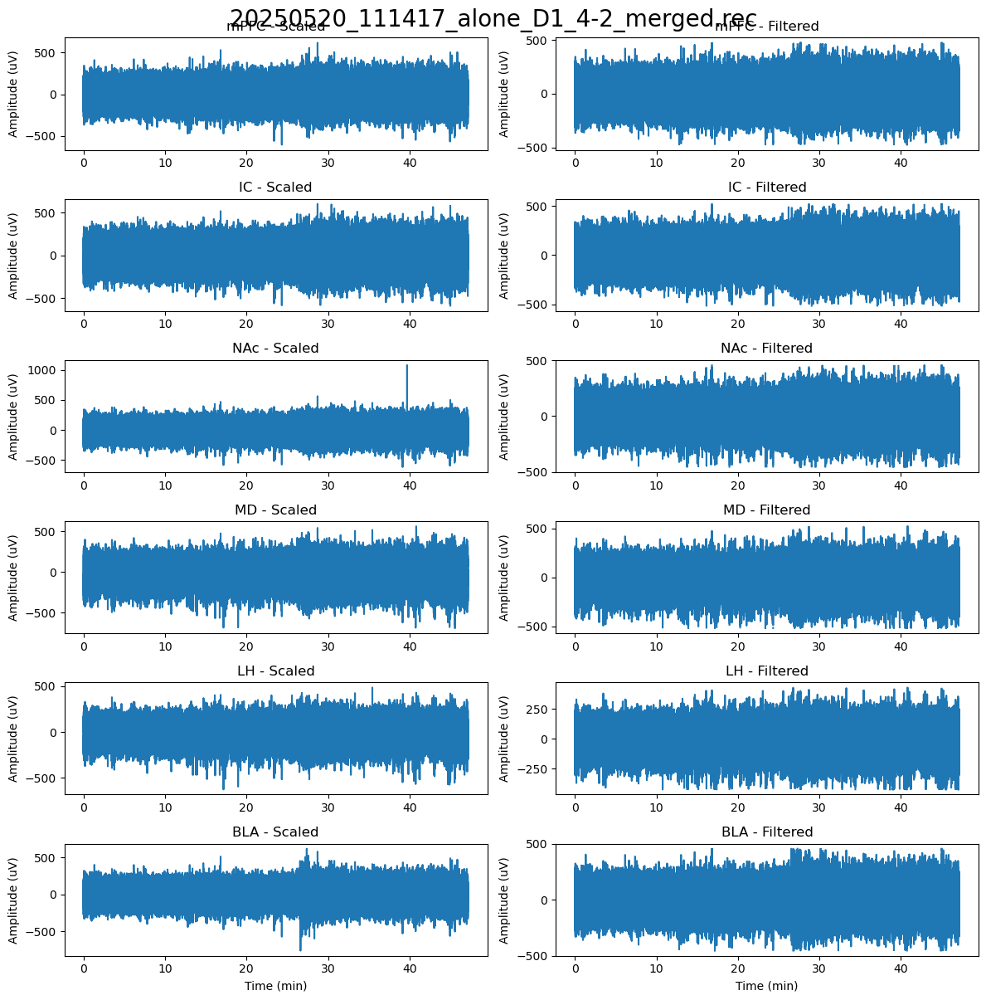

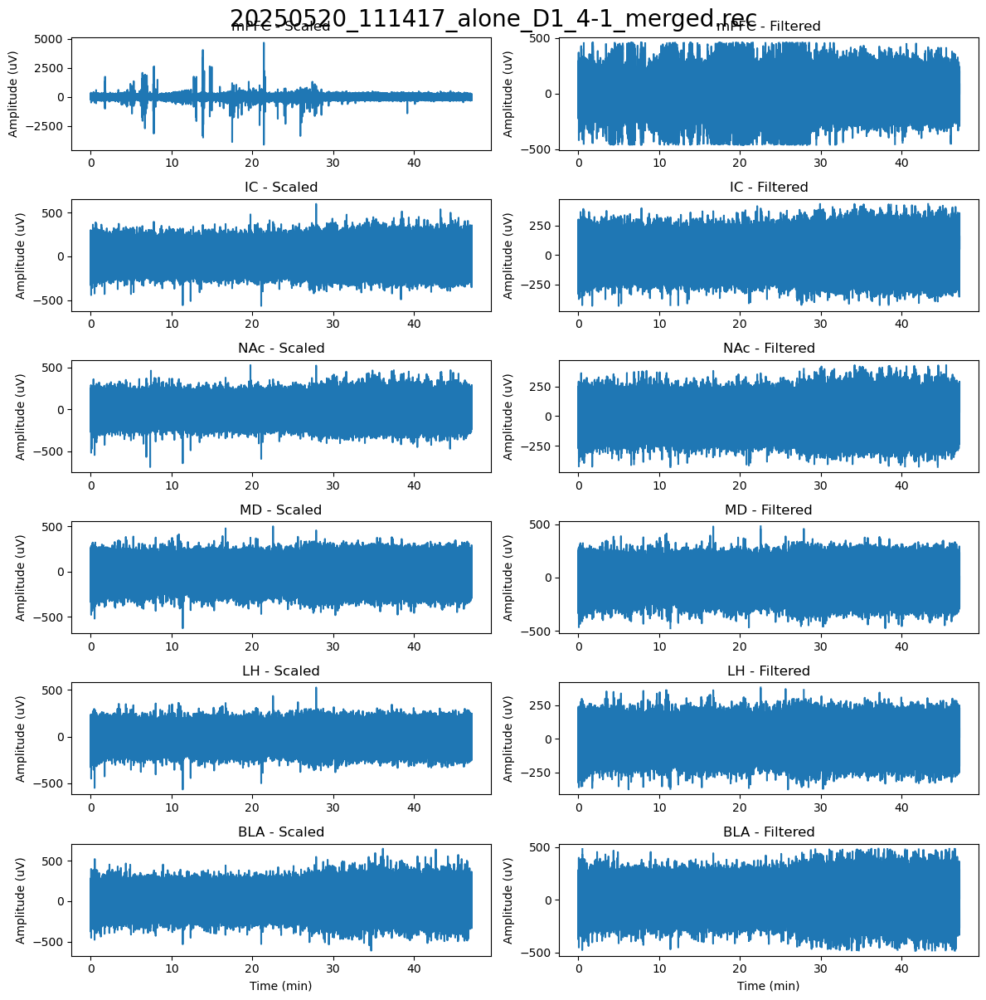

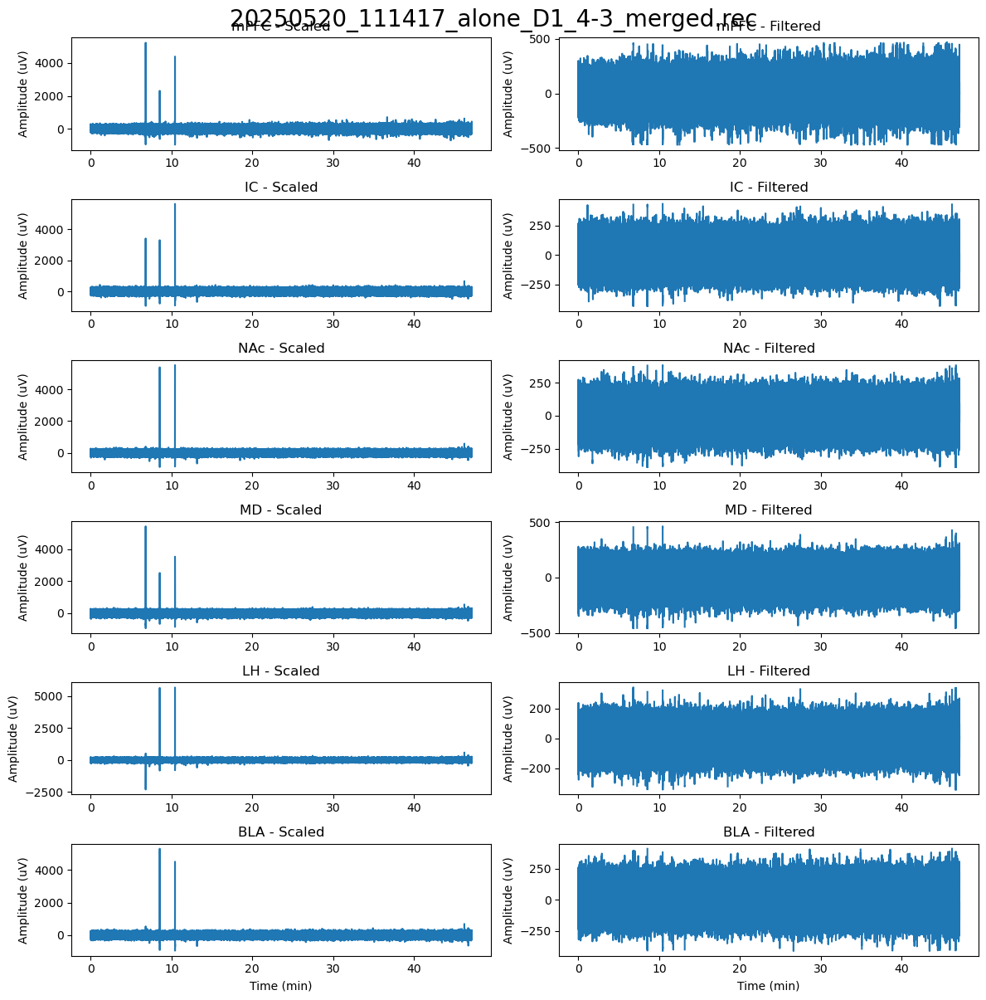

In [19]:
collection.diagnostic_plots(threshold = 5)

Found first timestamp


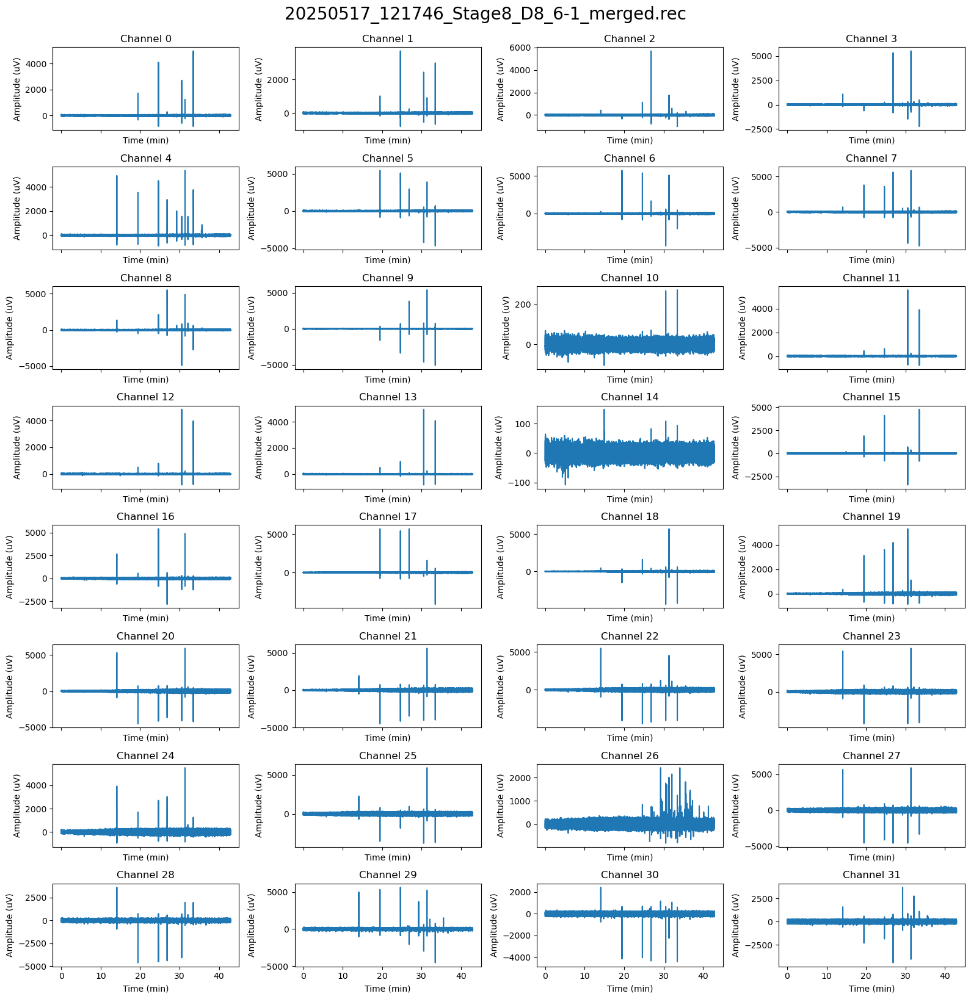

Found first timestamp


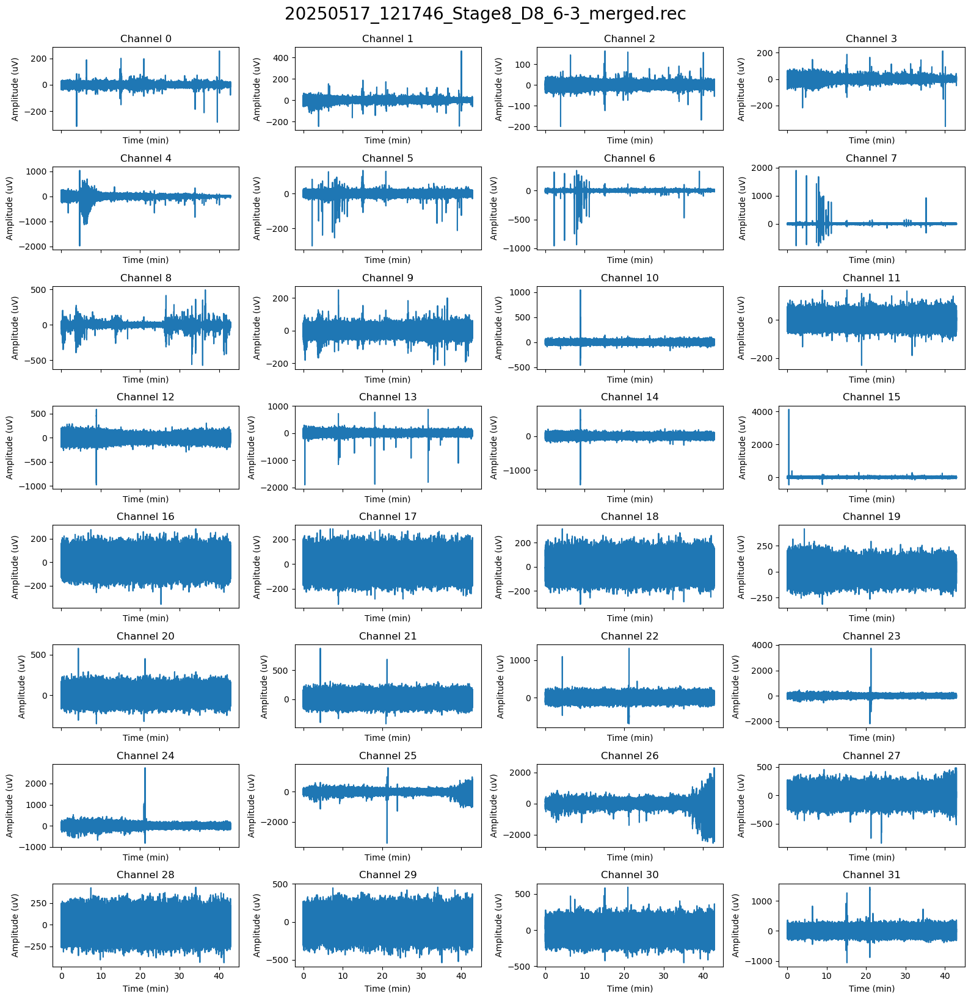

Found first timestamp


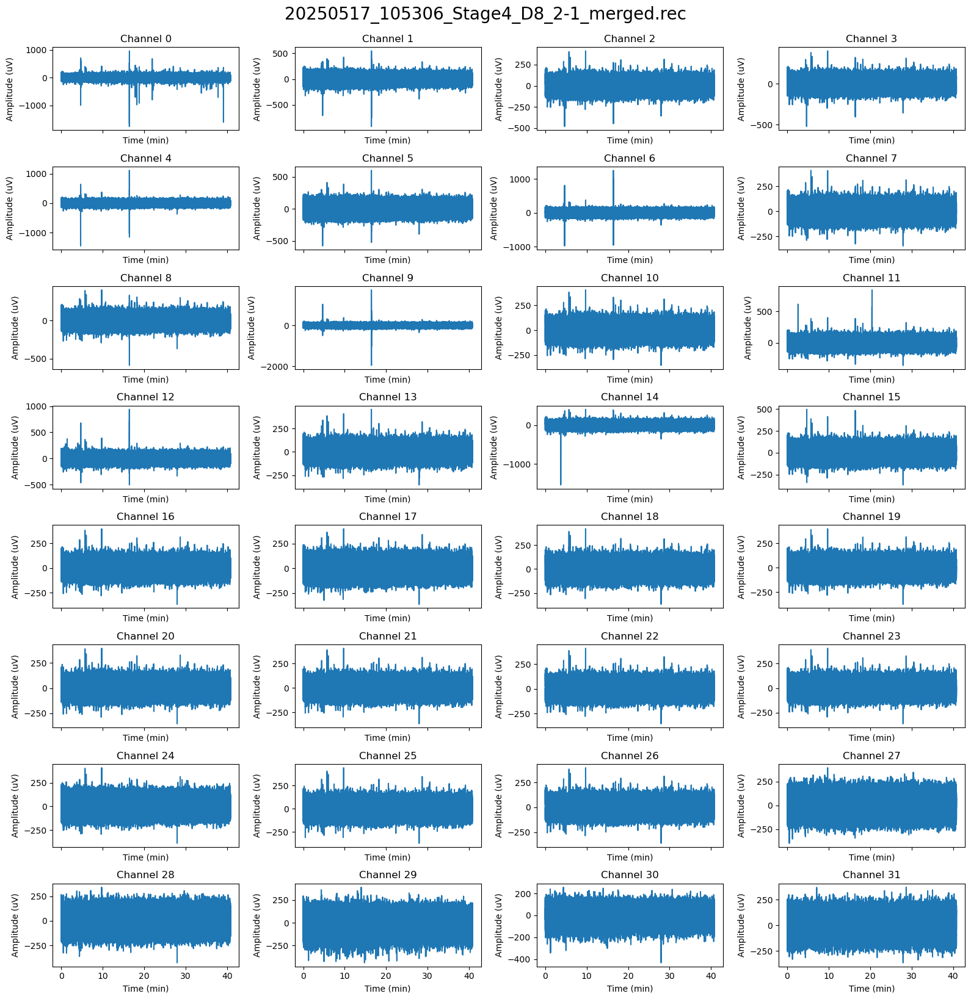

Found first timestamp


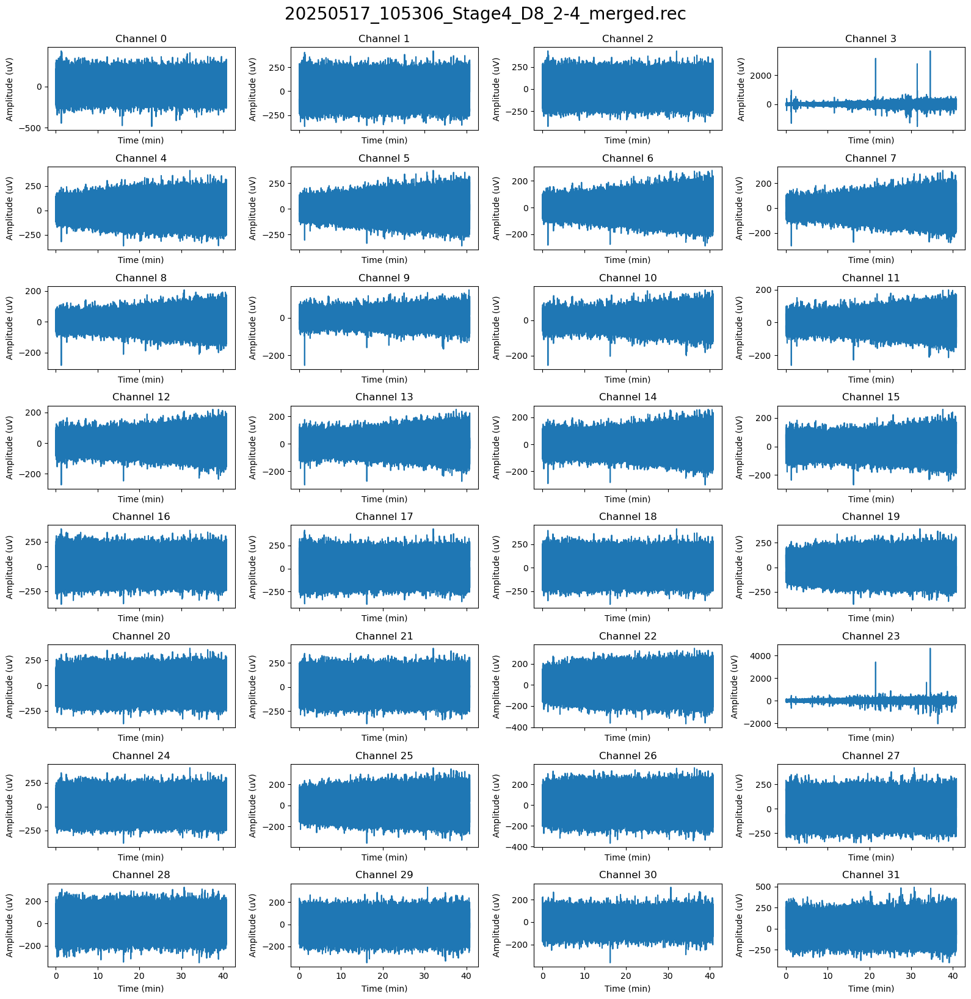

Found first timestamp


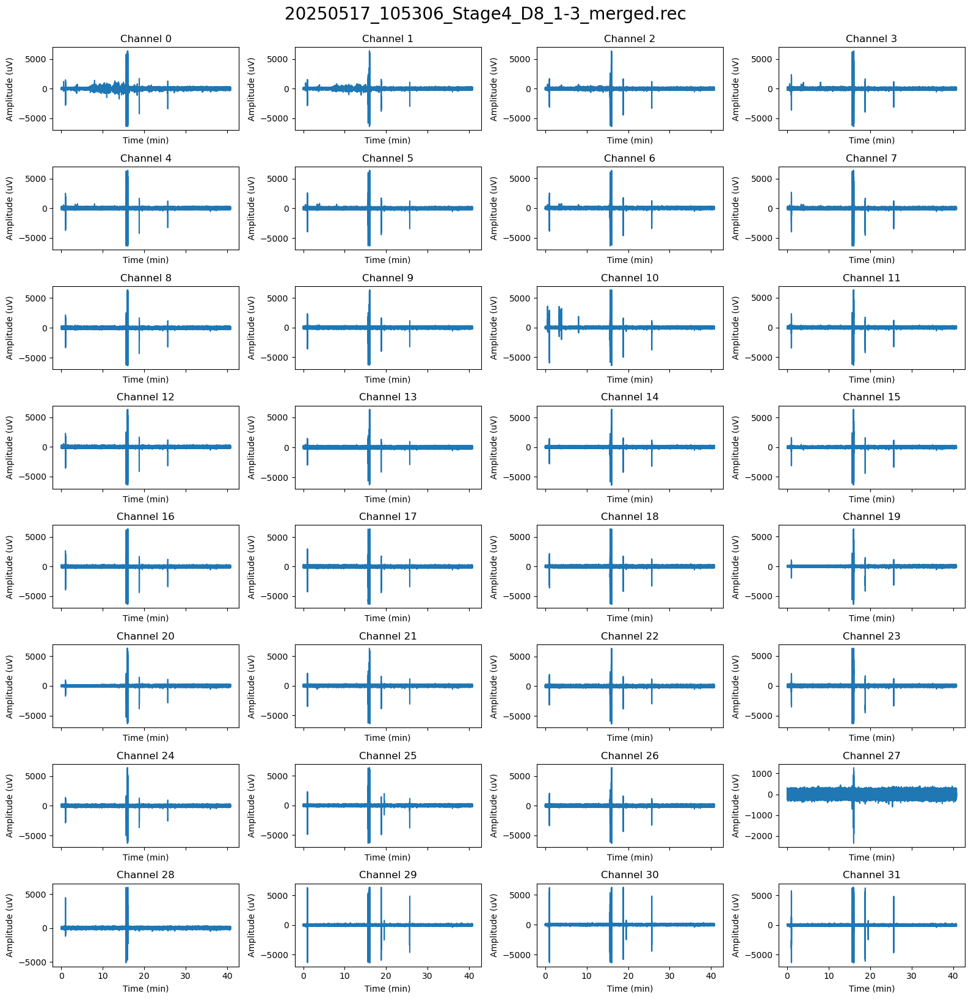

Found first timestamp


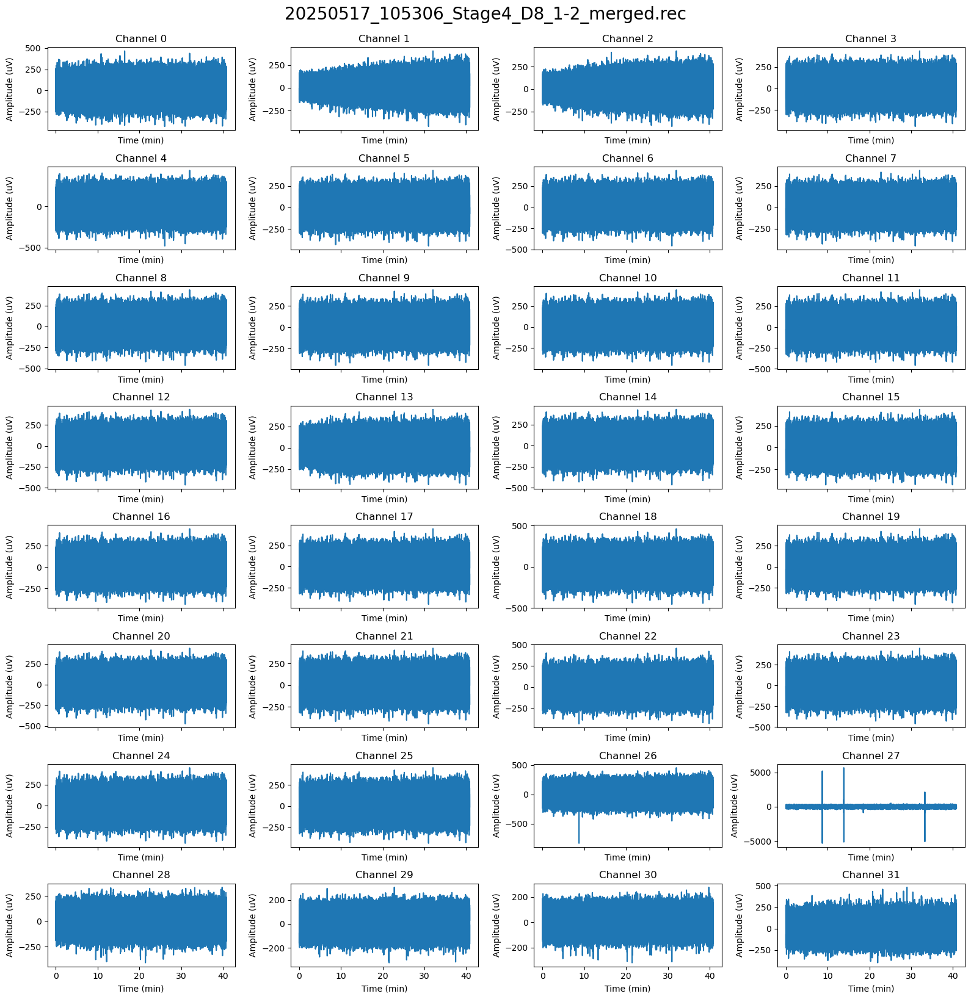

Found first timestamp


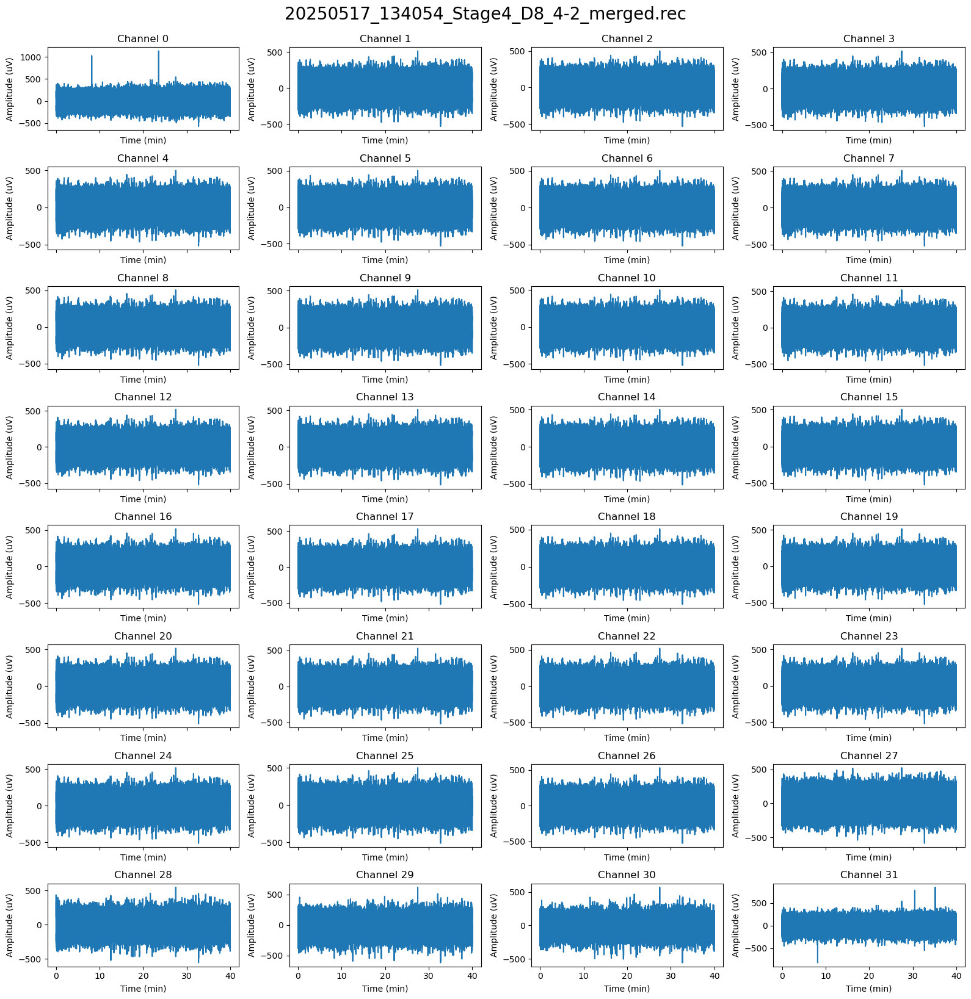

Found first timestamp


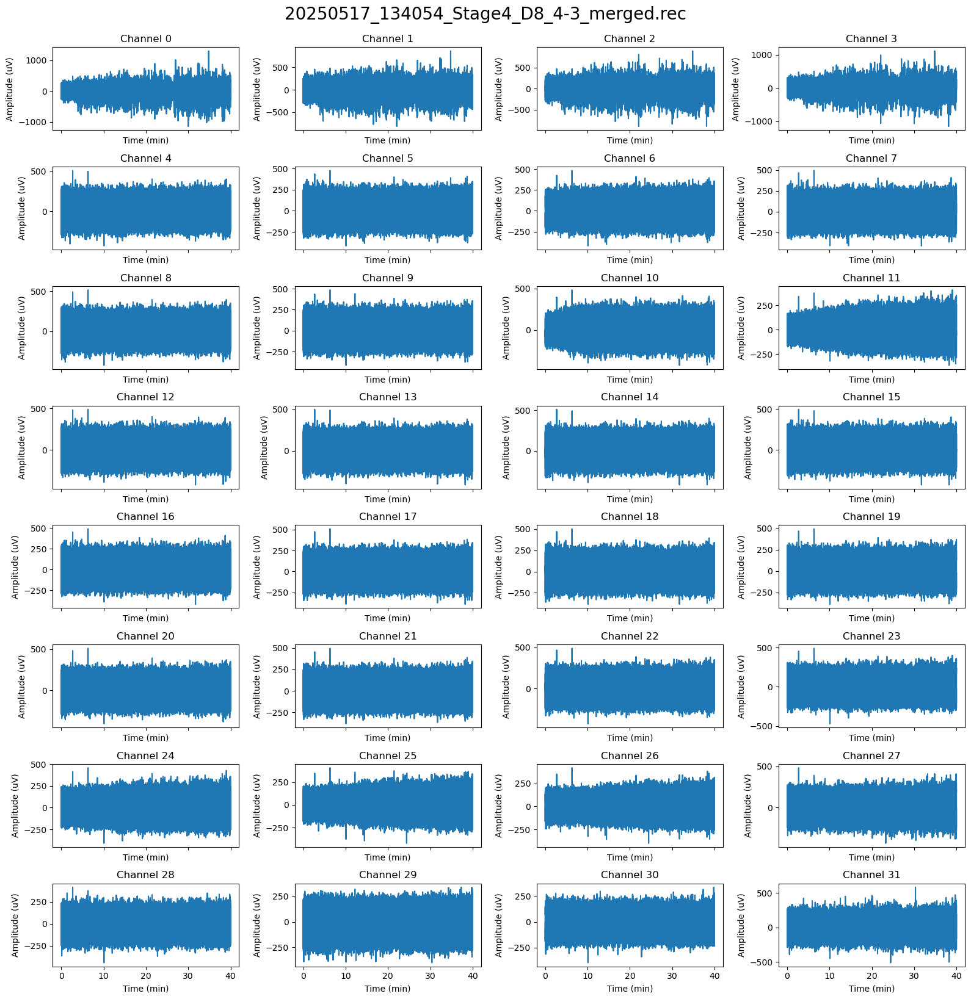

Found first timestamp


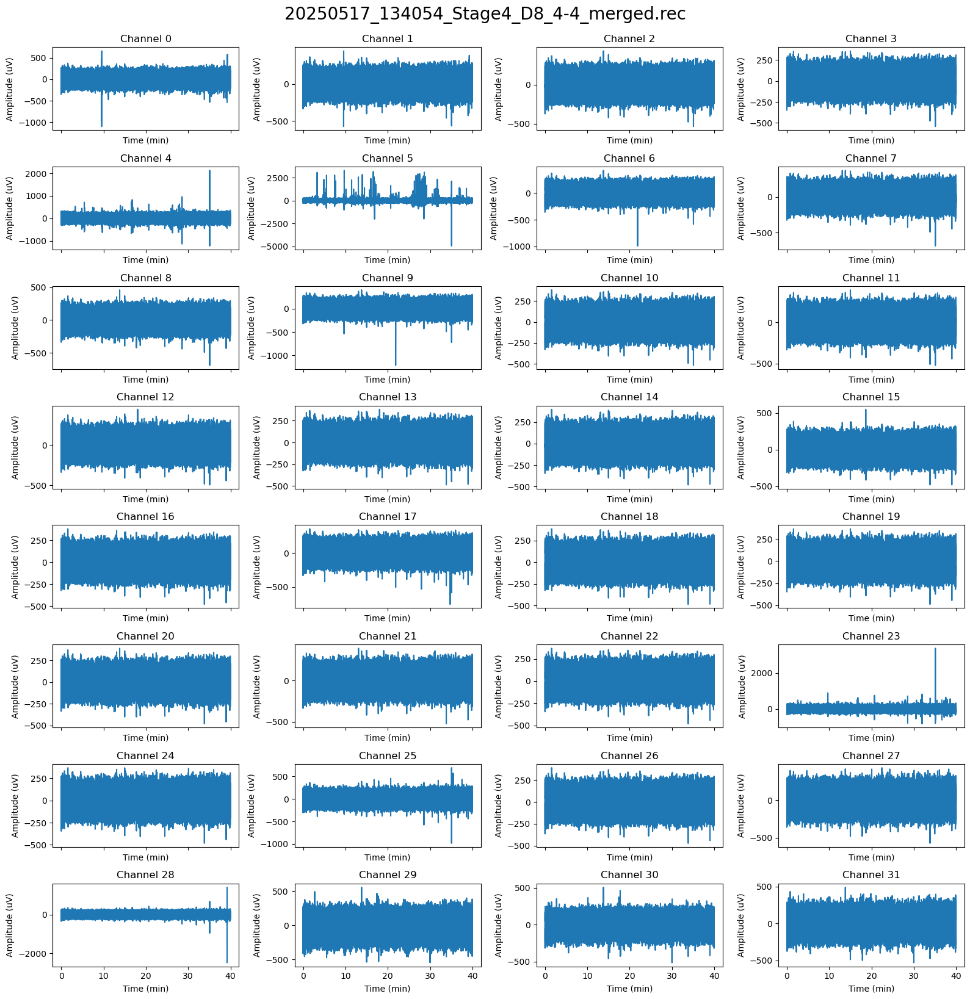

Found first timestamp


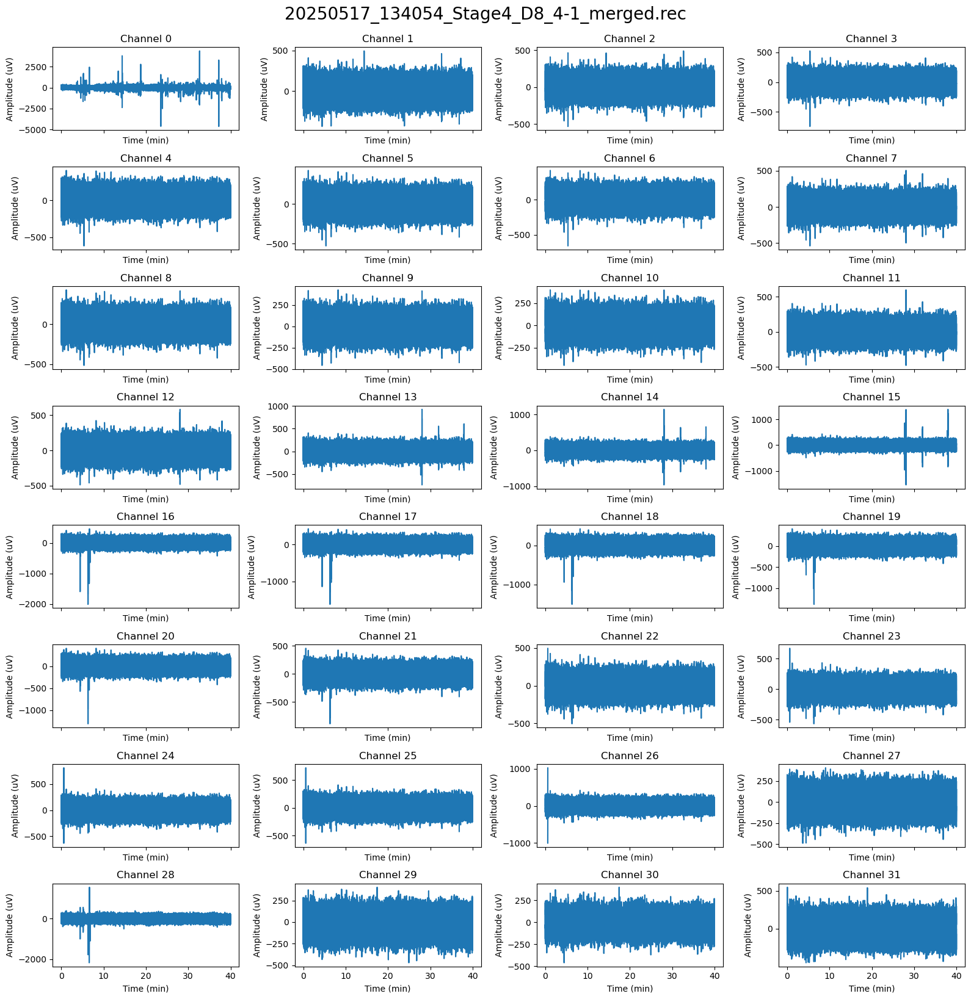

Found first timestamp


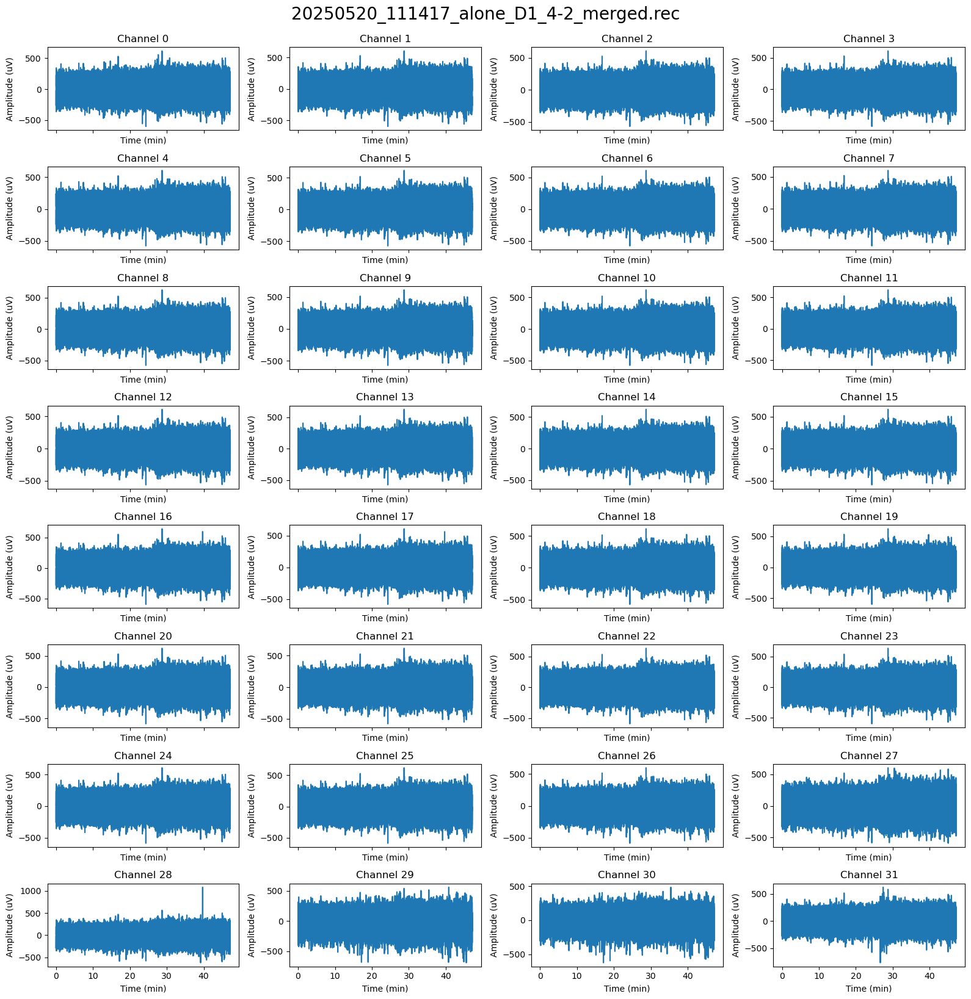

Found first timestamp


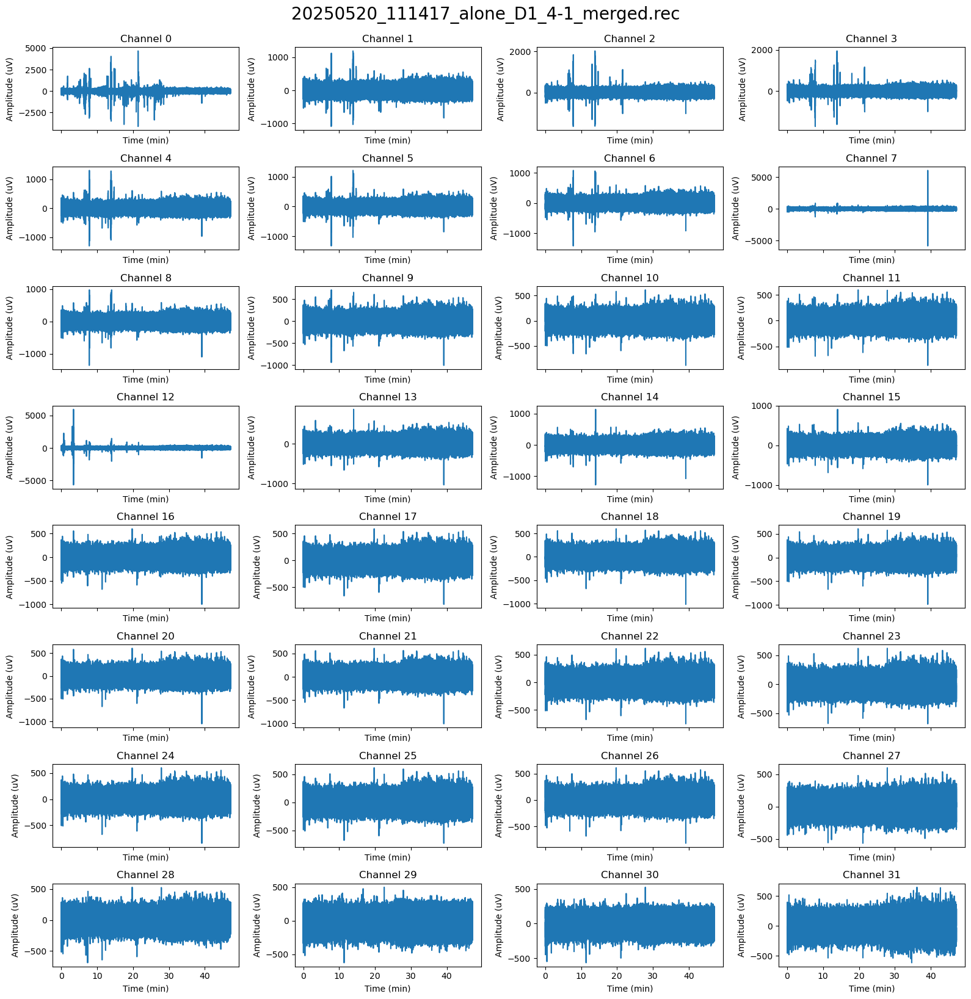

Found first timestamp


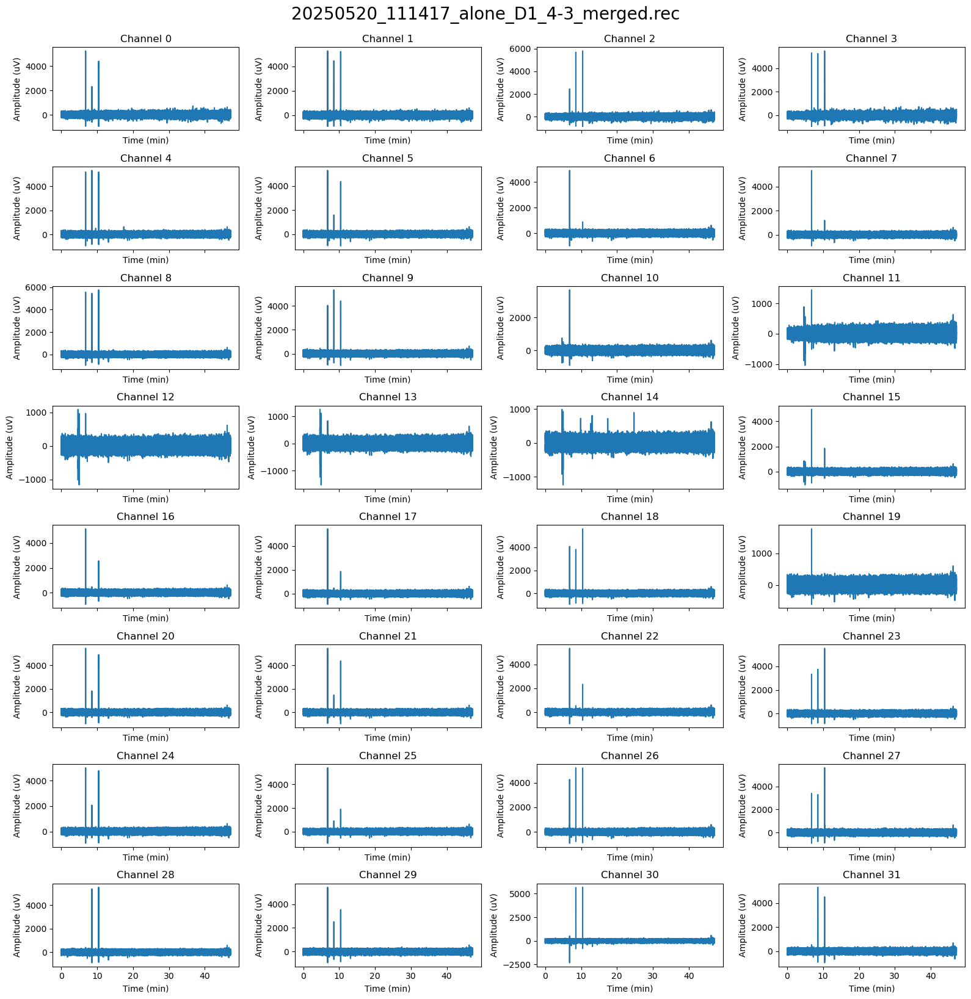

In [20]:
collection.diagnostic_plots_channel_finder()

In [6]:
collection.preprocess(threshold = 5)

  0%|          | 0/13 [00:00<?, ?it/s]

processing 20250517_121746_Stage8_D8_6-1_merged.rec


  8%|▊         | 1/13 [00:00<00:11,  1.08it/s]

RMS Traces calculated
processing 20250517_121746_Stage8_D8_6-3_merged.rec


 15%|█▌        | 2/13 [00:01<00:08,  1.23it/s]

RMS Traces calculated
processing 20250517_105306_Stage4_D8_2-1_merged.rec


 23%|██▎       | 3/13 [00:02<00:07,  1.34it/s]

RMS Traces calculated
processing 20250517_105306_Stage4_D8_2-4_merged.rec


 31%|███       | 4/13 [00:03<00:06,  1.38it/s]

RMS Traces calculated
processing 20250517_105306_Stage4_D8_1-3_merged.rec


 38%|███▊      | 5/13 [00:03<00:05,  1.44it/s]

RMS Traces calculated
processing 20250517_105306_Stage4_D8_1-2_merged.rec


 46%|████▌     | 6/13 [00:04<00:05,  1.38it/s]

RMS Traces calculated
processing 20250517_134054_Stage4_D8_4-2_merged.rec


 54%|█████▍    | 7/13 [00:05<00:04,  1.40it/s]

RMS Traces calculated
processing 20250517_134054_Stage4_D8_4-3_merged.rec


 62%|██████▏   | 8/13 [00:05<00:03,  1.42it/s]

RMS Traces calculated
processing 20250517_134054_Stage4_D8_4-4_merged.rec


 69%|██████▉   | 9/13 [00:06<00:02,  1.45it/s]

RMS Traces calculated
processing 20250517_134054_Stage4_D8_4-1_merged.rec


 77%|███████▋  | 10/13 [00:07<00:02,  1.44it/s]

RMS Traces calculated
processing 20250520_111417_alone_D1_4-2_merged.rec


 85%|████████▍ | 11/13 [00:07<00:01,  1.37it/s]

RMS Traces calculated
processing 20250520_111417_alone_D1_4-1_merged.rec


 92%|█████████▏| 12/13 [00:08<00:00,  1.31it/s]

RMS Traces calculated
processing 20250520_111417_alone_D1_4-3_merged.rec


100%|██████████| 13/13 [00:09<00:00,  1.36it/s]

RMS Traces calculated


In [7]:
collection.calculate_all()



  0%|          | 0/13 [00:00<?, ?it/s]

Power Calculated
Coherence calcualatd


Maximum iterations reached. 4545 of 5147 converged
Maximum iterations reached. 4593 of 5147 converged
Maximum iterations reached. 4576 of 5147 converged
Maximum iterations reached. 4613 of 5147 converged
Maximum iterations reached. 4600 of 5147 converged
Maximum iterations reached. 4947 of 5147 converged
Maximum iterations reached. 4939 of 5147 converged
Maximum iterations reached. 4980 of 5147 converged
Maximum iterations reached. 4972 of 5147 converged
Maximum iterations reached. 5019 of 5147 converged
Maximum iterations reached. 5048 of 5147 converged
Maximum iterations reached. 5040 of 5147 converged
Maximum iterations reached. 5011 of 5147 converged
Maximum iterations reached. 5030 of 5147 converged
Maximum iterations reached. 5067 of 5147 converged
  8%|▊         | 1/13 [01:01<12:14, 61.23s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 5062 of 5147 converged
Maximum iterations reached. 5121 of 5147 converged
Maximum iterations reached. 5125 of 5147 converged
Maximum iterations reached. 5111 of 5147 converged
Maximum iterations reached. 5088 of 5147 converged
Maximum iterations reached. 5062 of 5147 converged
Maximum iterations reached. 5071 of 5147 converged
Maximum iterations reached. 5059 of 5147 converged
Maximum iterations reached. 5037 of 5147 converged
Maximum iterations reached. 5087 of 5147 converged
Maximum iterations reached. 5109 of 5147 converged
Maximum iterations reached. 5090 of 5147 converged
Maximum iterations reached. 5086 of 5147 converged
Maximum iterations reached. 5093 of 5147 converged
Maximum iterations reached. 5078 of 5147 converged
 15%|█▌        | 2/13 [01:53<10:14, 55.86s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 4848 of 4897 converged
Maximum iterations reached. 4851 of 4897 converged
Maximum iterations reached. 4848 of 4897 converged
Maximum iterations reached. 4826 of 4897 converged
Maximum iterations reached. 4852 of 4897 converged
Maximum iterations reached. 4869 of 4897 converged
Maximum iterations reached. 4879 of 4897 converged
Maximum iterations reached. 4855 of 4897 converged
Maximum iterations reached. 4885 of 4897 converged
Maximum iterations reached. 4874 of 4897 converged
Maximum iterations reached. 4847 of 4897 converged
Maximum iterations reached. 4885 of 4897 converged
Maximum iterations reached. 4813 of 4897 converged
Maximum iterations reached. 4875 of 4897 converged
Maximum iterations reached. 4851 of 4897 converged
 23%|██▎       | 3/13 [02:42<08:49, 52.97s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 4891 of 4897 converged
Maximum iterations reached. 4873 of 4897 converged
Maximum iterations reached. 4879 of 4897 converged
Maximum iterations reached. 4834 of 4897 converged
Maximum iterations reached. 4845 of 4897 converged
Maximum iterations reached. 4864 of 4897 converged
Maximum iterations reached. 4881 of 4897 converged
Maximum iterations reached. 4836 of 4897 converged
Maximum iterations reached. 4847 of 4897 converged
Maximum iterations reached. 4877 of 4897 converged
Maximum iterations reached. 4834 of 4897 converged
Maximum iterations reached. 4841 of 4897 converged
Maximum iterations reached. 4813 of 4897 converged
Maximum iterations reached. 4833 of 4897 converged
Maximum iterations reached. 4796 of 4897 converged
 31%|███       | 4/13 [03:32<07:44, 51.62s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 4801 of 4897 converged
Maximum iterations reached. 4788 of 4897 converged
Maximum iterations reached. 4781 of 4897 converged
Maximum iterations reached. 4775 of 4897 converged
Maximum iterations reached. 4777 of 4897 converged
Maximum iterations reached. 4824 of 4897 converged
Maximum iterations reached. 4796 of 4897 converged
Maximum iterations reached. 4791 of 4897 converged
Maximum iterations reached. 4793 of 4897 converged
Maximum iterations reached. 4782 of 4897 converged
Maximum iterations reached. 4777 of 4897 converged
Maximum iterations reached. 4778 of 4897 converged
Maximum iterations reached. 4795 of 4897 converged
Maximum iterations reached. 4800 of 4897 converged
Maximum iterations reached. 4795 of 4897 converged
 38%|███▊      | 5/13 [04:21<06:46, 50.86s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 4874 of 4897 converged
Maximum iterations reached. 4881 of 4897 converged
Maximum iterations reached. 4879 of 4897 converged
Maximum iterations reached. 4869 of 4897 converged
Maximum iterations reached. 4867 of 4897 converged
Maximum iterations reached. 4866 of 4897 converged
Maximum iterations reached. 4865 of 4897 converged
Maximum iterations reached. 4854 of 4897 converged
Maximum iterations reached. 4852 of 4897 converged
Maximum iterations reached. 4865 of 4897 converged
Maximum iterations reached. 4863 of 4897 converged
Maximum iterations reached. 4856 of 4897 converged
Maximum iterations reached. 4860 of 4897 converged
Maximum iterations reached. 4855 of 4897 converged
Maximum iterations reached. 4839 of 4897 converged
 46%|████▌     | 6/13 [05:11<05:52, 50.43s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 4744 of 4795 converged
Maximum iterations reached. 4727 of 4795 converged
Maximum iterations reached. 4713 of 4795 converged
Maximum iterations reached. 4719 of 4795 converged
Maximum iterations reached. 4744 of 4795 converged
Maximum iterations reached. 4729 of 4795 converged
Maximum iterations reached. 4735 of 4795 converged
Maximum iterations reached. 4726 of 4795 converged
Maximum iterations reached. 4743 of 4795 converged
Maximum iterations reached. 4705 of 4795 converged
Maximum iterations reached. 4701 of 4795 converged
Maximum iterations reached. 4722 of 4795 converged
Maximum iterations reached. 4700 of 4795 converged
Maximum iterations reached. 4703 of 4795 converged
Maximum iterations reached. 4705 of 4795 converged
 54%|█████▍    | 7/13 [06:00<04:58, 49.80s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 4783 of 4795 converged
Maximum iterations reached. 4781 of 4795 converged
Maximum iterations reached. 4789 of 4795 converged
Maximum iterations reached. 4789 of 4795 converged
Maximum iterations reached. 4761 of 4795 converged
Maximum iterations reached. 4769 of 4795 converged
Maximum iterations reached. 4782 of 4795 converged
Maximum iterations reached. 4786 of 4795 converged
Maximum iterations reached. 4761 of 4795 converged
Maximum iterations reached. 4771 of 4795 converged
Maximum iterations reached. 4781 of 4795 converged
Maximum iterations reached. 4763 of 4795 converged
Maximum iterations reached. 4760 of 4795 converged
Maximum iterations reached. 4765 of 4795 converged
Maximum iterations reached. 4765 of 4795 converged
 62%|██████▏   | 8/13 [06:48<04:06, 49.39s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 4758 of 4794 converged
Maximum iterations reached. 4743 of 4794 converged
Maximum iterations reached. 4758 of 4794 converged
Maximum iterations reached. 4762 of 4794 converged
Maximum iterations reached. 4776 of 4794 converged
Maximum iterations reached. 4727 of 4794 converged
Maximum iterations reached. 4751 of 4794 converged
Maximum iterations reached. 4752 of 4794 converged
Maximum iterations reached. 4767 of 4794 converged
Maximum iterations reached. 4718 of 4794 converged
Maximum iterations reached. 4726 of 4794 converged
Maximum iterations reached. 4750 of 4794 converged
Maximum iterations reached. 4725 of 4794 converged
Maximum iterations reached. 4779 of 4794 converged
Maximum iterations reached. 4758 of 4794 converged
 69%|██████▉   | 9/13 [07:37<03:16, 49.12s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 4762 of 4795 converged
Maximum iterations reached. 4724 of 4795 converged
Maximum iterations reached. 4743 of 4795 converged
Maximum iterations reached. 4742 of 4795 converged
Maximum iterations reached. 4751 of 4795 converged
Maximum iterations reached. 4733 of 4795 converged
Maximum iterations reached. 4763 of 4795 converged
Maximum iterations reached. 4765 of 4795 converged
Maximum iterations reached. 4769 of 4795 converged
Maximum iterations reached. 4702 of 4795 converged
Maximum iterations reached. 4729 of 4795 converged
Maximum iterations reached. 4732 of 4795 converged
Maximum iterations reached. 4729 of 4795 converged
Maximum iterations reached. 4752 of 4795 converged
Maximum iterations reached. 4757 of 4795 converged
 77%|███████▋  | 10/13 [08:25<02:26, 48.93s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 5566 of 5658 converged
Maximum iterations reached. 5540 of 5658 converged
Maximum iterations reached. 5528 of 5658 converged
Maximum iterations reached. 5520 of 5658 converged
Maximum iterations reached. 5566 of 5658 converged
Maximum iterations reached. 5550 of 5658 converged
Maximum iterations reached. 5539 of 5658 converged
Maximum iterations reached. 5526 of 5658 converged
Maximum iterations reached. 5543 of 5658 converged
Maximum iterations reached. 5506 of 5658 converged
Maximum iterations reached. 5504 of 5658 converged
Maximum iterations reached. 5526 of 5658 converged
Maximum iterations reached. 5511 of 5658 converged
Maximum iterations reached. 5502 of 5658 converged
Maximum iterations reached. 5479 of 5658 converged
 85%|████████▍ | 11/13 [09:22<01:42, 51.46s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 5550 of 5659 converged
Maximum iterations reached. 5537 of 5659 converged
Maximum iterations reached. 5564 of 5659 converged
Maximum iterations reached. 5560 of 5659 converged
Maximum iterations reached. 5488 of 5659 converged
Maximum iterations reached. 5568 of 5659 converged
Maximum iterations reached. 5609 of 5659 converged
Maximum iterations reached. 5606 of 5659 converged
Maximum iterations reached. 5538 of 5659 converged
Maximum iterations reached. 5583 of 5659 converged
Maximum iterations reached. 5580 of 5659 converged
Maximum iterations reached. 5527 of 5659 converged
Maximum iterations reached. 5598 of 5659 converged
Maximum iterations reached. 5564 of 5659 converged
Maximum iterations reached. 5556 of 5659 converged
 92%|█████████▏| 12/13 [10:19<00:53, 53.20s/it]

Granger causality calculated
Power Calculated
Coherence calcualatd


Maximum iterations reached. 5622 of 5659 converged
Maximum iterations reached. 5615 of 5659 converged
Maximum iterations reached. 5634 of 5659 converged
Maximum iterations reached. 5623 of 5659 converged
Maximum iterations reached. 5622 of 5659 converged
Maximum iterations reached. 5608 of 5659 converged
Maximum iterations reached. 5633 of 5659 converged
Maximum iterations reached. 5618 of 5659 converged
Maximum iterations reached. 5627 of 5659 converged
Maximum iterations reached. 5602 of 5659 converged
Maximum iterations reached. 5601 of 5659 converged
Maximum iterations reached. 5619 of 5659 converged
Maximum iterations reached. 5586 of 5659 converged
Maximum iterations reached. 5628 of 5659 converged
Maximum iterations reached. 5613 of 5659 converged
100%|██████████| 13/13 [11:17<00:00, 52.08s/it]

Granger causality calculated


In [8]:
collection.save_to_json(r"share/eli_coop_grant/lfp")

In [90]:
from collections import defaultdict
condition_dict = defaultdict(list)
for recording in collection.recordings: 
    if recording.name == '20250517_121746_Stage8_D8_6-1_merged.rec':
        recording.condition = 'alone'
        condition_dict['alone'].append(recording.name)
    if recording.name == '20250517_121746_Stage8_D8_6-3_merged.rec':
        recording.condition = 'alone'
        condition_dict['alone'].append(recording.name)
    if recording.name == '20250517_105306_Stage4_D8_2-1_merged.rec':
        recording.condition = 'recipient'
        condition_dict['recipient'].append(recording.name)
    if recording.name == '20250517_105306_Stage4_D8_2-4_merged.rec':
        recording.condition = 'subject'
        condition_dict['subject'].append(recording.name)
    if recording.name == '20250517_105306_Stage4_D8_1-3_merged.rec':
        recording.condition = 'recipient'
        condition_dict['recipient'].append(recording.name)
    if recording.name == '20250517_105306_Stage4_D8_1-2_merged.rec':
        recording.condition = 'subject'
        condition_dict['subject'].append(recording.name)
    if recording.name == '20250517_134054_Stage4_D8_4-2_merged.rec':
        recording.condition = 'recipient'
        condition_dict['recipient'].append(recording.name)
    if recording.name == '20250517_134054_Stage4_D8_4-3_merged.rec':
        recording.condition = 'subject'
        condition_dict['subject'].append(recording.name)
    if recording.name == '20250517_134054_Stage4_D8_4-4_merged.rec':
        recording.condition = 'subject'
        condition_dict['subject'].append(recording.name)
    if recording.name == '20250517_134054_Stage4_D8_4-1_merged.rec':
        recording.condition = 'recipient'
        condition_dict['recipient'].append(recording.name)
#     if recording.name == '20250520_111417_alone_D1_4-2_merged.rec':
        
#     if recording.name == '20250520_111417_alone_D1_4-1_merged.rec':
#     if recording.name == '20250520_111417_alone_D1_4-3_merged.rec':

        
        

print(condition_dict)

defaultdict(<class 'list'>, {'alone': ['20250517_121746_Stage8_D8_6-1_merged.rec', '20250517_121746_Stage8_D8_6-3_merged.rec'], 'recipient': ['20250517_105306_Stage4_D8_2-1_merged.rec', '20250517_105306_Stage4_D8_1-3_merged.rec', '20250517_134054_Stage4_D8_4-2_merged.rec', '20250517_134054_Stage4_D8_4-1_merged.rec'], 'subject': ['20250517_105306_Stage4_D8_2-4_merged.rec', '20250517_105306_Stage4_D8_1-2_merged.rec', '20250517_134054_Stage4_D8_4-3_merged.rec', '20250517_134054_Stage4_D8_4-4_merged.rec']})


In [42]:
os.chdir(

'/blue/npadillacoreano'

In [37]:
import numpy as np
def random_event_generator(start, stop, len_event, no_events):
    total_duration = stop - start
    possible_events = np.arange(int(total_duration / len_event))
    pot_events = np.random.choice(possible_events, size = (no_events), replace = False)
    pot_events = np.sort(pot_events)
    events = []
    for i in pot_events: 
        event_start = (start + (len_event * i))
        event_stop = (event_start + (len_event))
        events.append(np.array([event_start, event_stop]))
    return(np.array(events))


In [57]:
for recording in collection.recordings: 
    start = 0
    stop = recording.power.shape[0]*0.5*1000 
    recording.event_dict = {}
    random_events = random_event_generator(start, stop, len_event = 10000, no_events = 30)
    
    recording.event_dict['random event'] = random_events

In [135]:
os.chdir('/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys')
import lfp.lfp_analysis.event_extraction as ee
def average_events_condition(
    lfp_collection, events, mode, condition_dict, baseline=None, event_len=None, pre_window=0, post_window=0, plot=False, regions = None, freq_range = None):
    """
    Calculates average event measurement (power, coherence, or granger) per recording then
    calculates global averages across all recordings from recording averages (to account for
    differences in event numbers per recording)
    """
    event_averages_dict = {}
    recordings = lfp_collection.recordings
    if baseline is not None:
        if (len(events) != len(baseline)) and (lee(baseline) == 1):
            baseline = baseline * len(events)
    for i in range(len(events)):
        for condition, recording_list in condition_dict.items():
            recording_averages = []
            for recording in recordings:
                if recording.name in recording_list:
                    event_averages = ee.get_events(recording, events[i], mode, event_len, pre_window, post_window, average = True)
                    if baseline is not None:
                        adj_averages = ee.__baseline_diff__(
                            recording, event_averages, baseline[i], mode, event_len, pre_window=0, post_window=0, average = True
                        )
                        rec_event_average = np.mean(np.array(adj_averages), axis = 0)
                        recording_averages.append(rec_event_average)
                    else:
                        rec_event_average = np.mean(np.array(event_averages), axis = 0)
                        recording_averages.append(rec_event_average)

                # recording_averages = [recs, b, f] or [recs, b, b, f]
            print(np.array(recording_averages).shape)    
            event_averages_dict[condition] = recording_averages
        if plot:
            lfplt.plot_average_events(lfp_collection, event_averages_dict, mode, regions, freq_range)
        return event_averages_dict
condition_coherence = average_events_condition(collection, events = ['random event'], mode = 'coherence', condition_dict = condition_dict)
condition_power = average_events_condition(collection, events = ['random event'], mode = 'power', condition_dict = condition_dict)

(2, 500, 6, 6)
(4, 500, 6, 6)
(4, 500, 6, 6)
(2, 500, 6)
(4, 500, 6)
(4, 500, 6)


In [131]:
del condition_power['recipient']
del condition_coherence['recipient']

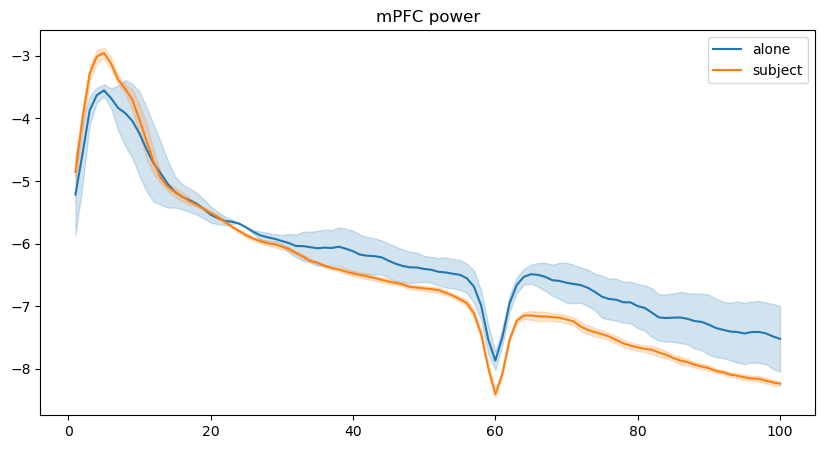

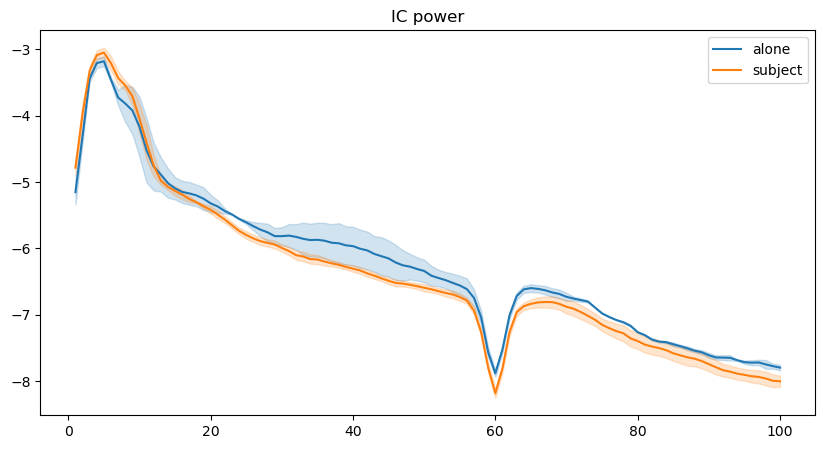

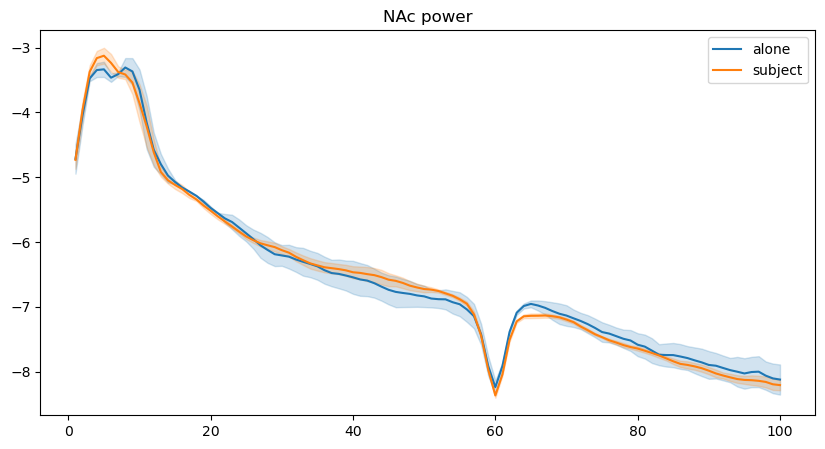

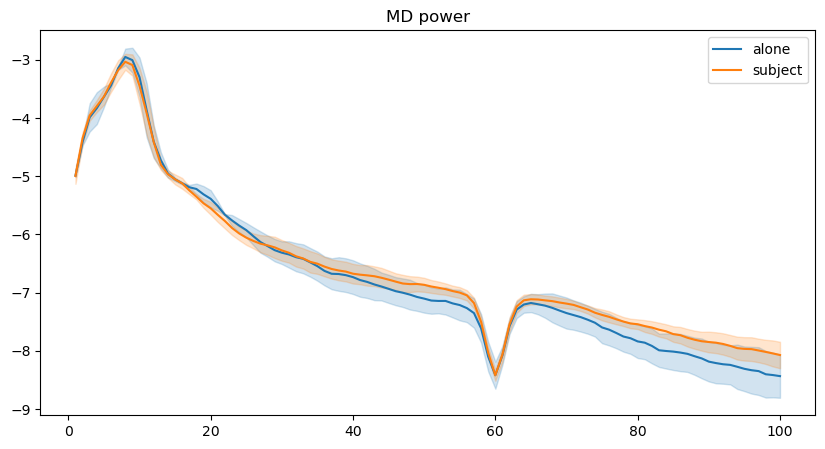

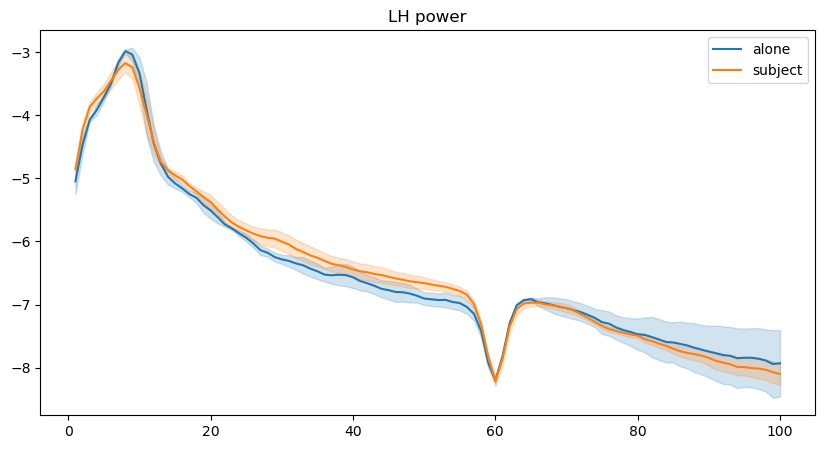

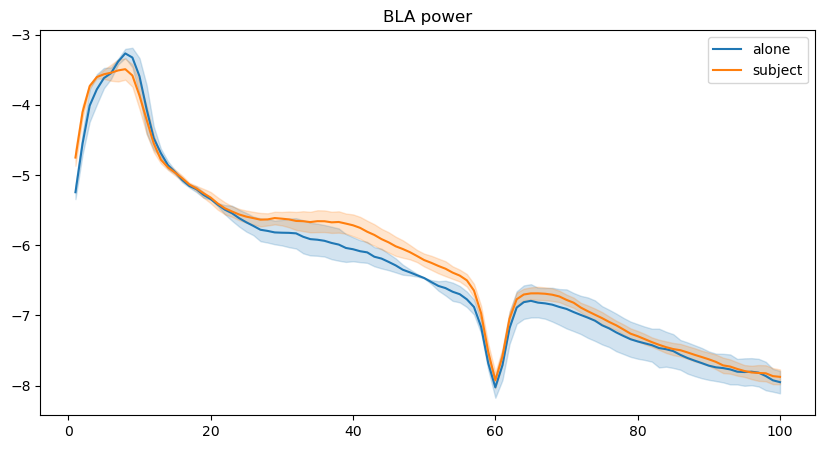

/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/plotting.py:81: RuntimeWarning: Mean of empty slice
  second_region_name = lfp_collection.brain_region_dict.inverse[second_region]
/blue/npadillacoreano/mcum/SocialMemEphys/diff_fam_social_memory_ephys/lfp/lfp_analysis/plotting.py:84: SmallSampleWarning: After omitting NaNs, one or more axis-slices of one or more sample arguments is too small; corresponding elements of returned arrays will be NaN. See documentation for sample size requirements.
  # event_average = [f, b, b]; average across all trials


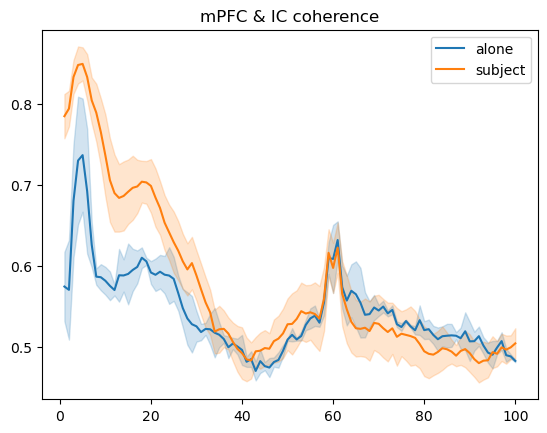

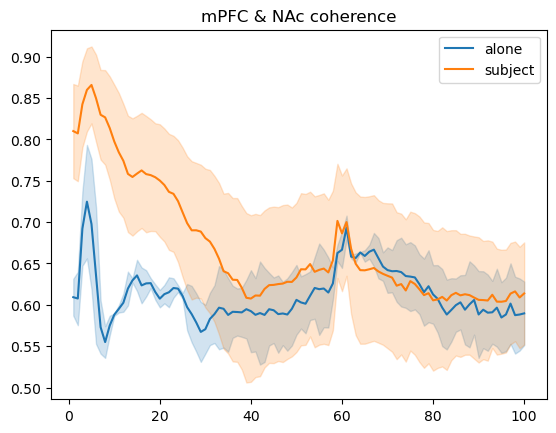

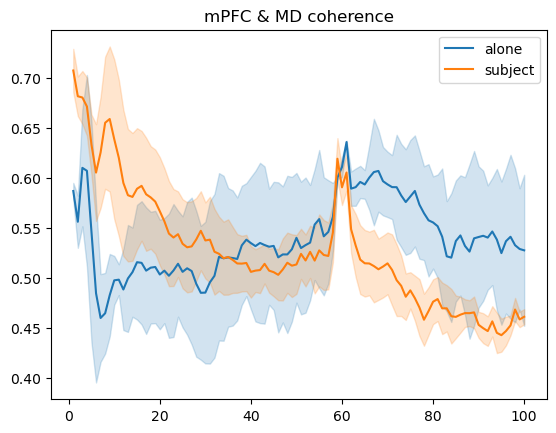

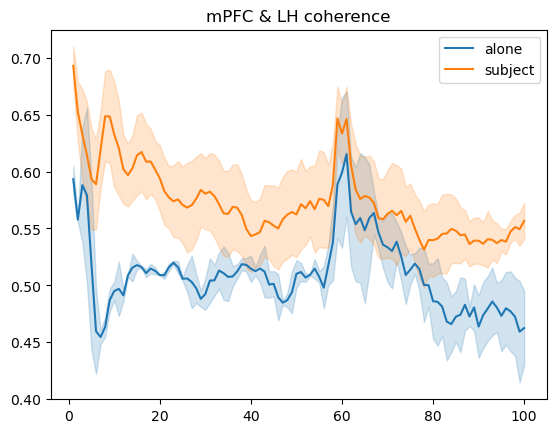

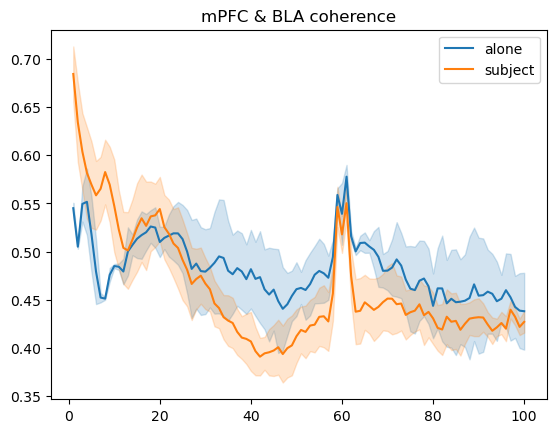

...

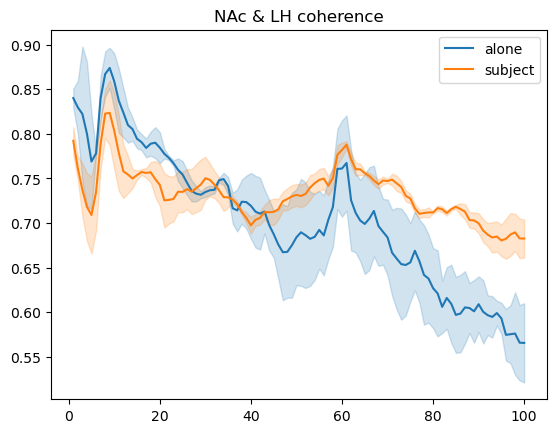

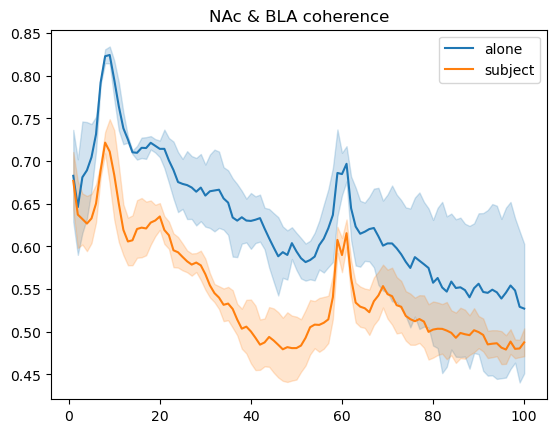

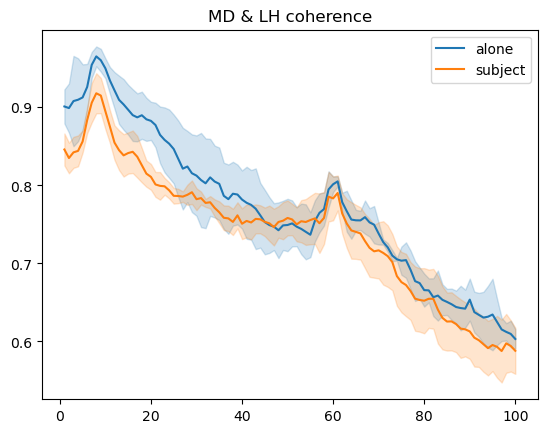

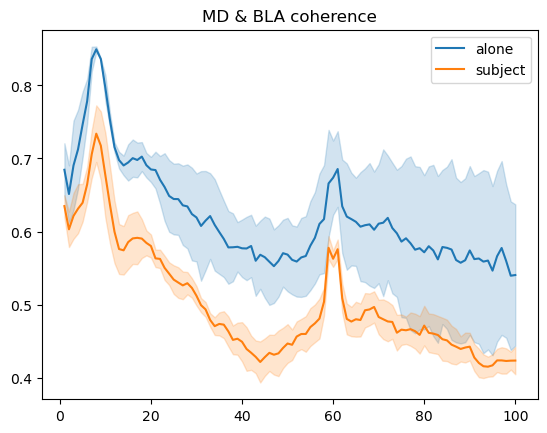

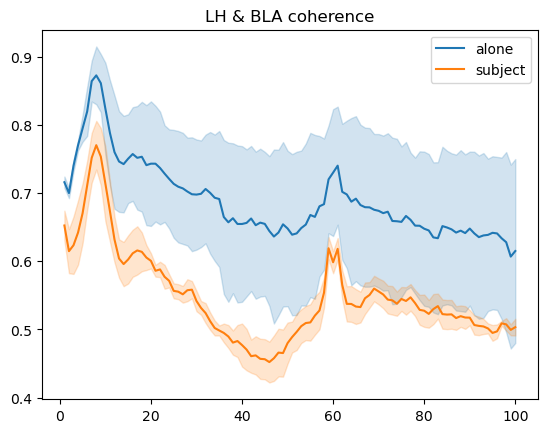

In [132]:
import lfp.lfp_analysis.plotting as lfplt
from importlib import reload
reload(lfplt)

lfplt.plot_event_spectrum(collection, condition_power, mode = 'power',log = True)
lfplt.plot_event_spectrum(collection, condition_coherence, mode = 'coherence',log = False)

In [ ]:
def event_power_bar(lfp_collection, events, baseline=None):
    powers = ee.average_events(lfp_collection, events=events, mode="power", baseline=baseline, plot=False)
    [unflipped, flipped] = band_calcs(powers)
    brain_regions = np.empty(len(lfp_collection.brain_region_dict.keys()), dtype="<U10")
    for i in range(len(lfp_collection.brain_region_dict.keys())):
        brain_regions[i] = lfp_collection.brain_region_dict.inverse[i]
    avg_values = {key: {subset: {event: [] for event in events} for subset in brain_regions} for key in flipped.keys()}
    sem_values = {key: {subset: {event: [] for event in events} for subset in brain_regions} for key in flipped.keys()}
    for key in flipped.keys():
        for i, subset in enumerate(brain_regions):
            for event in events:
                avg_values[key][subset][event] = np.nanmean(flipped[key][event][:, i])
                sem_values[key][subset][event] = stats.sem(flipped[key][event][:, i], nan_policy="omit")

    # Adjust bar width and spacing based on number of events
    total_width = 0.8  # Total width available for each group of bars
    bar_width = total_width / len(events)  # Width of each bar
    col = cm.rainbow(np.linspace(0, 1, len(events)))

    # Spacing between groups of bars
    group_spacing = 1  # Increased for better separation between brain regions

    sorted_avg_values = {key: {subset: avg_values[key][subset] for subset in brain_regions} for key in flipped.keys()}
    sorted_sem_values = {key: {subset: sem_values[key][subset] for subset in brain_regions} for key in flipped.keys()}

    # Create a separate plot for each key
    for key in flipped.keys():
        plt.figure(figsize=(25, 10))
        x = np.arange(len(brain_regions)) * group_spacing  # x-axis positions for subsets

        for i, subset in enumerate(brain_regions):
            for k, event in enumerate(events):
                # Center the group of bars and space them evenly
                center = x[i]
                offset = (k - (len(events) - 1) / 2) * bar_width
                position = center + offset

                plt.bar(
                    position,
                    sorted_avg_values[key][subset][event],
                    width=bar_width,
                    yerr=sorted_sem_values[key][subset][event],
                    capsize=5,
                    linewidth=2,
                    error_kw={"elinewidth": 2, "capthick": 2},
                    color=col[k],
                    label=event if i == 0 else "",
                )

        plt.yticks(fontsize=20)
        plt.xticks(x, brain_regions, fontsize=24, rotation=45)
        plt.axhline(y=0, color="black", linestyle="--", alpha=0.8)
        plt.gca().spines["top"].set_visible(False)
        plt.gca().spines["right"].set_visible(False)
        plt.gca().spines["bottom"].set_linewidth(2)
        plt.gca().spines["left"].set_linewidth(2)
        plt.title(f"Average Power for {key}", fontsize=40)
        plt.legend(fontsize=26, frameon=False)
        plt.subplots_adjust(hspace=0.5)
        plt.show()
